# **Blood Cell Recognition using AI: Technical Demonstration**

> 👥 StepMedia Sofware Dev Team



## Project Objectives
1. Demonstrate an automated system for blood cell recognition and classification
2. Showcase the accuracy and efficiency of our AI-powered solution
3. Present real-world applications and benefits in medical diagnostics

## Technical Demo

### I. Introduction: Blood cell analysis in medical diagnostics is a fundamental medical laboratory procedure that plays a crucial role in healthcare.

1. Key Components of Blood Cell Analysis:
- Complete Blood Count (CBC): Measures different types of blood cells:
- Red Blood Cells (RBCs/Erythrocytes): Carry oxygen throughout the body
- White Blood Cells (WBCs/Leukocytes): Fight infections and diseases
- Platelets (Thrombocytes): Help in blood clotting

2. Traditional Analysis Methods:
- Manual Microscopy: Laboratory technicians examine blood smears under microscopes
- Flow Cytometry: Automated analysis of cell populations
- Hematology Analyzers: Automated cell counting and classification

3. Clinical Significance:
- Disease Detection: Identifying conditions like anemia, infections, and leukemia
- Monitoring Treatment: Tracking patient response to various therapies
- Preventive Care: Regular health screenings and early disease detection
- Pre-surgical Assessment: Evaluating patient fitness for procedures

4. Key Parameters Analyzed:
- Cell Counts: Quantitative measurement of each cell type
- Morphology: Cell shape, size, and structural abnormalities
- Distribution: Proportion of different cell types
- Cell Maturity: Identifying immature or abnormal cells

## II. Dataset and Preprocessing:
- Dataset quality is crucial for the success of AI blood cell recognition demos. High-quality datasets lead to accurate models, reduced training time, and increased reliability during demonstrations. However, selecting appropriate datasets presents significant challenges: online datasets often lack source information, have inconsistent quality, and insufficient validation. This requires development teams to spend time on validation, prepare multiple backup scenarios, and maintain transparency about model limitations with clients
- We have carefully selected datasets from reputable sources that have been extensively validated by the research community and are licensed for research and model development. These datasets have been peer-reviewed, widely cited in academic publications, and are specifically permitted for AI training and demonstration purposes.
- [BloodCell yolo format](https://www.kaggle.com/datasets/quangnguynvnnn/bloodcell-yolo-format)

In [3]:
# First, mount Google Drive if you haven't already
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
import kagglehub
bcd_datatset_path = kagglehub.dataset_download('quangnguynvnnn/bloodcell-yolo-format')

print('Data source import complete.')


Data source import complete.


### Dataset structure

In [5]:
import os
from pathlib import Path
import pandas as pd
from IPython.display import display, HTML

def display_yolo_structure(dataset_path):
    """
    Display the structure of a YOLO dataset including train/val/test splits,
    image counts, and label statistics.

    Args:
        dataset_path (str): Root path to the YOLO dataset
    """
    # Convert to Path object for easier handling
    root = Path(dataset_path)

    print("📁 YOLO Dataset Structure Analysis\n")

    # Initialize counters
    total_images = 0
    total_labels = 0
    splits_info = {}

    # Expected YOLO structure
    expected_dirs = ['train', 'valid', 'test']

    for split in expected_dirs:
        split_path = root / split
        if not split_path.exists():
            continue

        # Count images
        image_path = split_path / 'images'
        images = list(image_path.glob('*.jpg')) + list(image_path.glob('*.png'))
        num_images = len(images)

        # Count labels
        label_path = split_path / 'labels'
        labels = list(label_path.glob('*.txt'))
        num_labels = len(labels)

        splits_info[split] = {
            'images': num_images,
            'labels': num_labels
        }

        total_images += num_images
        total_labels += num_labels

    # Create a DataFrame for better visualization
    df = pd.DataFrame.from_dict(splits_info, orient='index')

    # Display summary
    print(f"Dataset Location: {root}\n")
    print("📊 Dataset Statistics:")
    print(f"Total Images: {total_images}")
    print(f"Total Labels: {total_labels}\n")

    print("📂 Split Distribution:")
    display(df.style.set_caption("Dataset Split Statistics")
            .format("{:,}")
            .background_gradient(cmap='Blues'))

    # Check dataset structure
    print("\n✔️ Dataset Structure Validation:")
    for split in expected_dirs:
        if (root / split).exists():
            print(f"\n{split}:")
            print(f"  ├── images/")
            print(f"  └── labels/")

            # Sample a few image names
            sample_images = list((root / split / 'images').glob('*.jpg'))[:3]
            if sample_images:
                print(f"      Sample images:")
                for img in sample_images:
                    print(f"      ├── {img.name}")

def analyze_yolo_labels(dataset_path, num_classes):
    """
    Analyze YOLO label distribution across classes

    Args:
        dataset_path (str): Root path to the YOLO dataset
        num_classes (int): Number of classes in the dataset
    """
    root = Path(dataset_path)
    class_counts = {i: 0 for i in range(num_classes)}

    print("\n📊 Label Distribution Analysis:")

    for split in ['train', 'valid', 'test']:
        label_path = root / split / 'labels'
        if not label_path.exists():
            continue

        for label_file in label_path.glob('*.txt'):
            with open(label_file, 'r') as f:
                for line in f:
                    class_id = int(line.split()[0])
                    class_counts[class_id] += 1

    # Create DataFrame for visualization
    df = pd.DataFrame.from_dict(class_counts, orient='index', columns=['Count'])
    df.index.name = 'Class ID'

    display(df.style.set_caption("Class Distribution")
            .format("{:,}")
            .background_gradient(cmap='Blues'))

# Example usage:
# display_yolo_structure('/content/dataset')
# analyze_yolo_labels('/content/dataset', num_classes=5)

In [6]:
display_yolo_structure(bcd_datatset_path)

📁 YOLO Dataset Structure Analysis

Dataset Location: /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1

📊 Dataset Statistics:
Total Images: 7950
Total Labels: 7950

📂 Split Distribution:


,images,labels
train,"6,000","6,000"
valid,"1,000","1,000"
test,950,950



✔️ Dataset Structure Validation:

train:
  ├── images/
  └── labels/
      Sample images:
      ├── BA_705900_jpg_jpg.rf.f4a4b79b42bc2ae3fe68f601d1e59f0e.jpg
      ├── LY_511879_jpg_jpg.rf.d5cc9335a1ab8af36ab7ebe001e1dada.jpg
      ├── LY_684028_jpg_jpg.rf.55cfc3c73c6478b3029abfb431e66a11.jpg

valid:
  ├── images/
  └── labels/
      Sample images:
      ├── PLATELET_430818_jpg_jpg.rf.ffd4f157b7763094d8621fa23699fcb0.jpg
      ├── EO_89877_jpg_jpg.rf.b0f4108bb80bd02161328c3682c4d9b4.jpg
      ├── MO_56423_jpg_jpg.rf.c49c7395cd8a1ab5d944b620b840ade1.jpg

test:
  ├── images/
  └── labels/
      Sample images:
      ├── BA_961010_jpg_jpg.rf.a875d8ebb199f61c3e3fac72a2c6542e.jpg
      ├── LY_130316_jpg_jpg.rf.008320ee8235f987a5bdaef9c37c95aa.jpg
      ├── BNE_64421_jpg_jpg.rf.66a820eea70606ef01cac21adac82fbd.jpg


### Introduction to the blood cell image dataset

In [7]:
from glob import glob
import os

HOME = "/kaggle/working"
def make_ds(root, path_to_copy):

    os.makedirs(path_to_copy, exist_ok = True)

    files = glob(f"{root}/*")
    for idx, file in enumerate(files):
        if os.path.isdir(file): os.system(f"cp -r '{file}' {path_to_copy}")
        elif os.path.isfile(file): os.system(f"cp '{file}' {path_to_copy}")

root = "/kaggle/input/blood-cell-detection-datatset"
make_ds(root = root, path_to_copy = f"{HOME}/datasets")

Data analysis is in process...

Data analysis is in process...

Data analysis is in process...



<ipython-input-8-a9a811b311b3>:105: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)
<ipython-input-8-a9a811b311b3>:105: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)
<ipython-input-8-a9a811b311b3>:105: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)


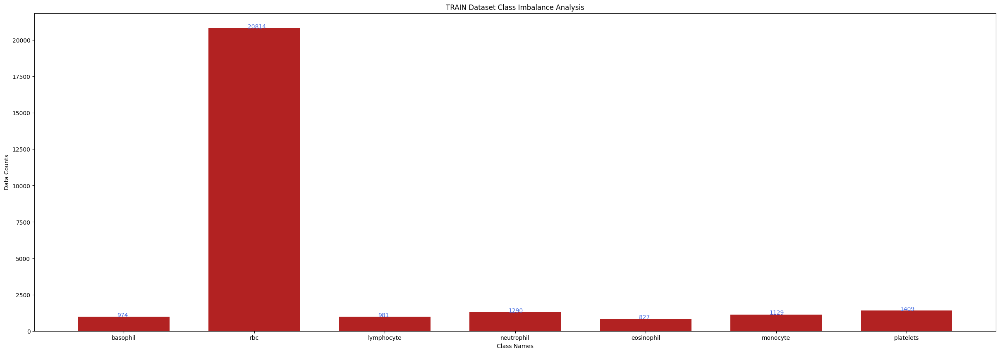

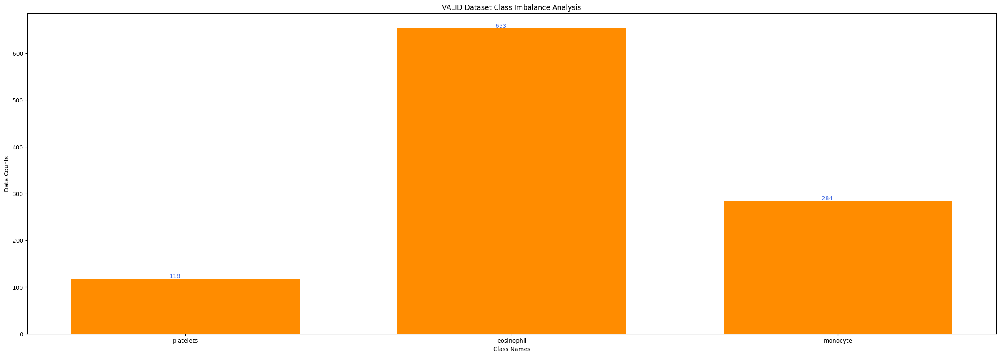

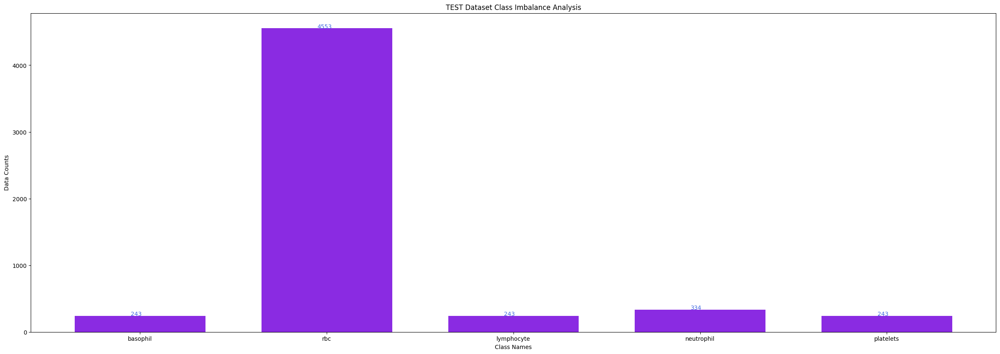

In [8]:
import cv2, yaml, random, numpy as np
from PIL import Image
from matplotlib import pyplot as plt
from torchvision import transforms as T

class Visualization:

    def __init__(self, data_types, n_ims, rows, cmap = None):

        self.n_ims, self.rows = n_ims, rows
        self.cmap, self.data_types  = cmap, data_types
        self.colors = ["firebrick", "darkorange", "blueviolet"]

        self.get_cls_names(); self.get_bboxes()

    def get_cls_names(self):

        with open(f"{bcd_datatset_path}/data.yaml", 'r') as file: data = yaml.safe_load(file)
        # Extract class names
        class_names = data['names']

        # Create a dictionary with index as key and class name as value
        self.class_dict = {index: name for index, name in enumerate(class_names)}

    def get_bboxes(self):

        self.vis_datas, self.analysis_datas, self.im_paths = {}, {}, {}
        for data_type in self.data_types:
            all_bboxes, all_analysis_datas = [], {}
            im_paths = glob(f"{bcd_datatset_path}/{data_type}/images/*")
            for idx, im_path in enumerate(im_paths):
                bboxes = []
                # if idx == 3: break
                lbl_path  = im_path.replace("images", "labels").replace(".jpg", ".txt")
                meta_data = open(lbl_path).readlines()
                for data in meta_data:
                    # Split the string by space and strip the newline character
                    # Change here
                    parts = data.strip().split()[:5]
                    cls_name = self.class_dict[int(parts[0])]
                    # Convert first element to integer and the rest to float
                    bboxes.append([cls_name] + [float(x) for x in parts[1:]])
                    if cls_name not in all_analysis_datas: all_analysis_datas[cls_name] = 1
                    else: all_analysis_datas[cls_name] += 1
                all_bboxes.append(bboxes)

            self.vis_datas[data_type] = all_bboxes; self.analysis_datas[data_type] = all_analysis_datas; self.im_paths[data_type] = im_paths

    def plot(self, rows, cols, count, im_path, bboxes):

        plt.subplot(rows, cols, count)
        or_im = np.array(Image.open(im_path).convert("RGB"))
        height, width, _ = or_im.shape

        for bbox in bboxes:

            class_id, x_center, y_center, w, h = bbox

            # Convert YOLO format to pixel values
            x_min = int((x_center - w / 2) * width)  # x_min
            y_min = int((y_center - h / 2) * height)  # y_min
            x_max = int((x_center + w / 2) * width)  # x_max
            y_max = int((y_center + h / 2) * height)  # y_max

            color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
            cv2.rectangle(img = or_im, pt1 = (x_min, y_min), pt2 = (x_max, y_max), color = color, thickness = 3)
        plt.imshow(or_im)
        plt.axis("off"); plt.title(f"There are {len(bboxes)} objects in the image.")

        return count + 1

    def vis(self, save_name):

        print(f"{save_name.upper()} Data Visualization is in process...\n")
        assert self.cmap in ["rgb", "gray"], "Please choose rgb or gray cmap"
        if self.cmap == "rgb": cmap = "viridis"
        cols = self.n_ims // self.rows; count = 1

        plt.figure(figsize = (25, 20))

        indices = [random.randint(a = 0, b = len(self.vis_datas[save_name]) - 1) for _ in range(self.n_ims)]

        for idx, index in enumerate(indices):

            if count == self.n_ims + 1: break

            im_path, bboxes = self.im_paths[save_name][index], self.vis_datas[save_name][index]

            count = self.plot(self.rows, cols, count, im_path = im_path, bboxes = bboxes)

        plt.show()

    def data_analysis(self, save_name, color):

        print("Data analysis is in process...\n")

        width, text_width, text_height = 0.7, 0.05, 2
        cls_names = list(self.analysis_datas[save_name].keys()); counts = list(self.analysis_datas[save_name].values())

        _, ax = plt.subplots(figsize = (30, 10))
        indices = np.arange(len(counts))

        ax.bar(indices, counts, width, color = color)
        ax.set_xlabel("Class Names", color = "black")
        ax.set_xticklabels(cls_names)
        ax.set(xticks = indices, xticklabels = cls_names)
        ax.set_ylabel("Data Counts", color = "black")
        ax.set_title(f"{save_name.upper()} Dataset Class Imbalance Analysis")

        for i, v in enumerate(counts): ax.text(i - text_width, v + text_height, str(v), color = "royalblue")

    def visualization(self): [self.vis(save_name) for save_name in self.data_types]

    def analysis(self): [self.data_analysis(save_name, color) for (save_name, color) in zip(self.data_types, self.colors)]

vis = Visualization(data_types = ["train", "valid", "test"], n_ims = 20, rows = 5, cmap = "rgb")
vis.analysis()

TRAIN Data Visualization is in process...



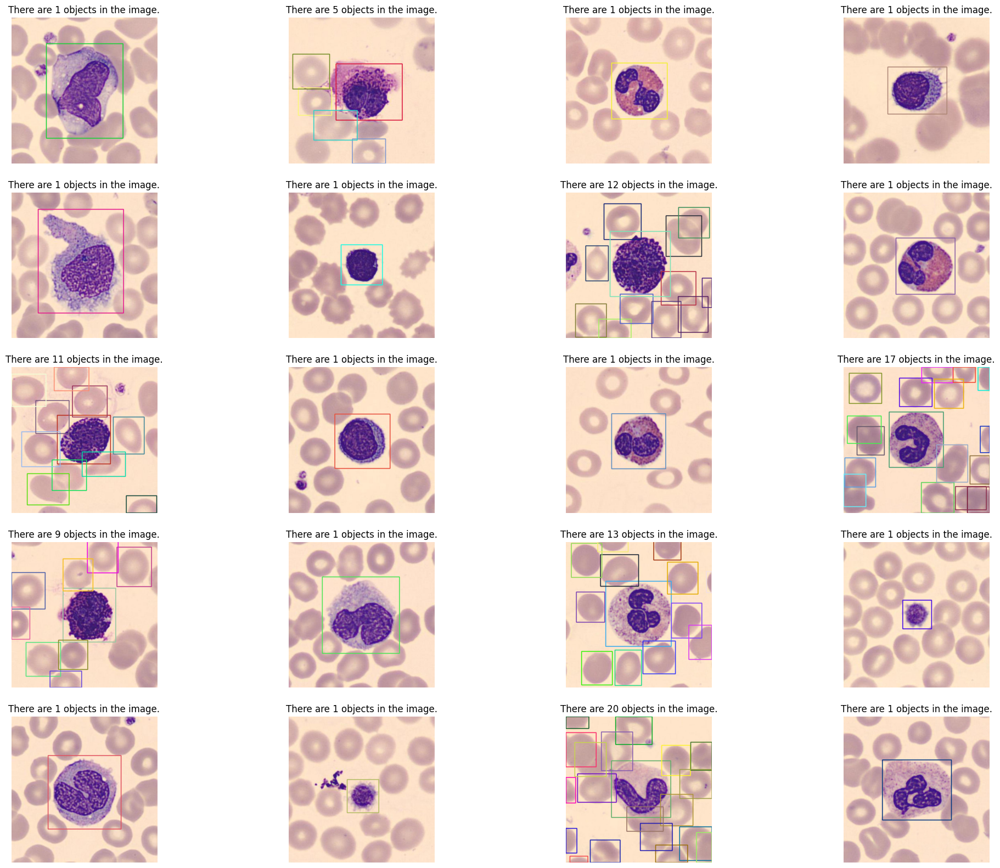

VALID Data Visualization is in process...



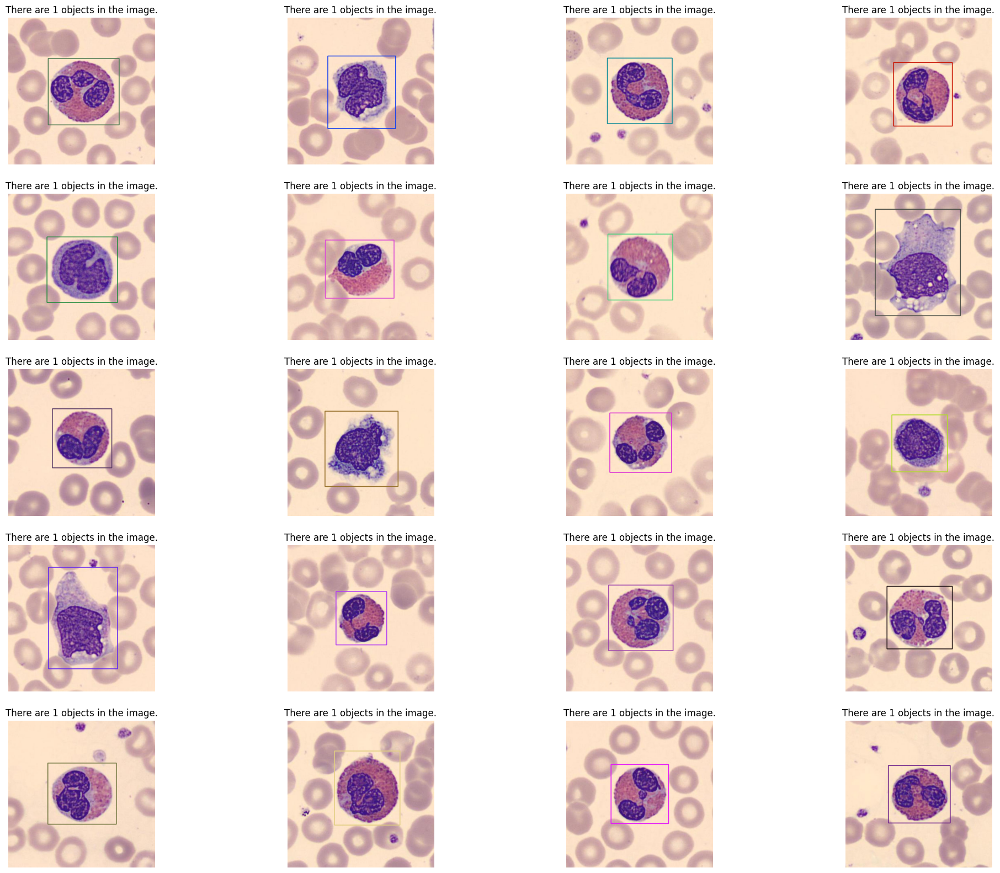

TEST Data Visualization is in process...



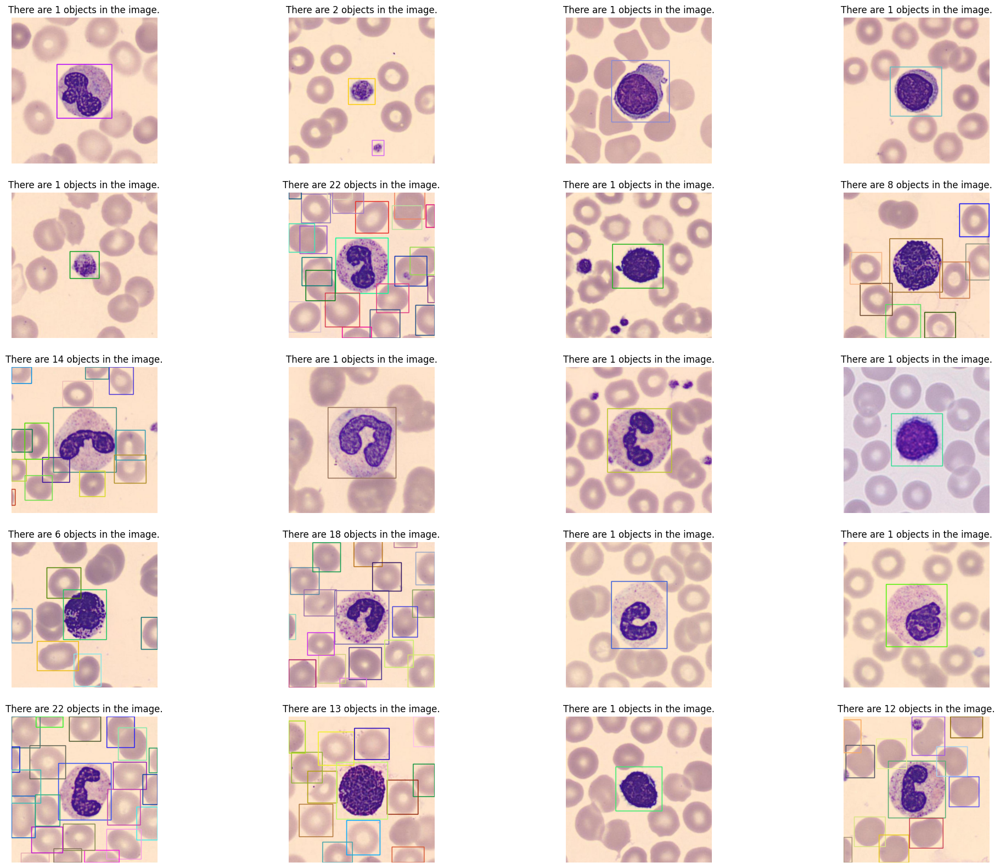

In [9]:
vis.visualization()

## III. Required Libraries and Dependencies
- Ultralytics YOLOv11: Latest version of the YOLO family, offering state-of-the-art performance for object detection

In [10]:
!pip install ultralytics
from ultralytics import YOLO
model = YOLO("yolo11n.pt")

## IV. Training process overview

- Google Colab Pro with A100 GPU for training 6000 images on train datasets (About 2-3 Hours to completed)

In [11]:
# Clear GPU memory and optimize CUDA before training
import torch
import gc
torch.cuda.empty_cache()
gc.collect()

# Set CUDA settings for optimal batch size computation
torch.backends.cudnn.benchmark = False  # Required for AutoBatch
torch.backends.cuda.matmul.allow_tf32 = True

# Start training with optimized parameters
train_results = model.train(
    data=f"{bcd_datatset_path}/data.yaml",  # Path to dataset YAML
    epochs=200,                             # Number of training epochs
    imgsz=480,                             # Training image size
    device=0,                              # GPU device selection

    # Training checkpoints and saving
    patience=50,                           # Early stopping patience
    save=True,                            # Save training results
    exist_ok=True,                        # Overwrite existing files
    save_period=10,                       # Save checkpoint every N epochs

    # Model configuration
    pretrained=True,                      # Use pretrained weights
    verbose=True,                         # Display detailed training info

    # Learning rate and optimization
    lr0=0.001,                           # Initial learning rate
    weight_decay=0.0005,                 # Weight decay for regularization
    warmup_epochs=3,                     # Gradual warmup epochs
    optimizer='AdamW',                   # Advanced optimizer
    cos_lr=True,                         # Cosine learning rate schedule

    # Memory and performance optimization
    batch=16,                            # Fixed batch size based on warning
    workers=8,                           # Reduced workers to save RAM
    cache='disk',                        # Cache to disk for deterministic results
    amp=True,                            # Automatic mixed precision
    half=True,                           # Use FP16 (half precision)

    # Data augmentation (balanced for performance)
    augment=True,                        # Enable augmentation
    mosaic=0.3,                          # Moderate mosaic augmentation
    mixup=0.2,                           # Moderate mixup augmentation
    close_mosaic=10,                     # Disable mosaic in final epochs

    # Advanced performance settings
    multi_scale=True,                    # Multi-scale training
    nbs=64,                             # Nominal batch size
    rect=False,                          # Disable rectangular training for shuffle
    profile=True,                       # Profile CUDA operations
    overlap_mask=True,                  # Overlap mask augmentation

    # Memory saving options
    max_det=300,                        # Maximum detections per image
    nms=True,                          # Use Non-Maximum Suppression

    # Project organization
    project='runs/detect',             # Project directory
    name='train',                       # Run name
    plots=True,                       # Enable plotting
    val=True,                         # Enable validation
    save_txt=True,                    # Save results to *.txt
    save_conf=True,                   # Save confidences in --save-txt labels
)

Ultralytics 8.3.73 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/data.yaml, epochs=200, time=None, patience=50, batch=16, imgsz=480, save=True, save_period=10, cache=disk, device=0, workers=8, project=runs/detect, name=train, exist_ok=True, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=True, freeze=None, multi_scale=True, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=True, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=True, save_conf=True, s

train: Scanning /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/train/labels... 6000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6000/6000 [00:04<00:00, 1348.67it/s]


train: New cache created: /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/train/labels.cache


train: Caching images (11.8GB Disk): 100%|██████████| 6000/6000 [00:41<00:00, 145.74it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/valid/labels... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<00:00, 1238.04it/s]

val: New cache created: /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/valid/labels.cache



val: Caching images (2.0GB Disk): 100%|██████████| 1000/1000 [00:05<00:00, 194.97it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 480 train, 480 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      3.33G      1.027      2.024      1.174         52        288: 100%|██████████| 375/375 [00:49<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [04:20<00:00,  8.14s/it]

                   all       1000       1055      0.741      0.768       0.88      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      3.59G     0.9134      1.417      1.121        111        288: 100%|██████████| 375/375 [00:43<00:00,  8.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:57<00:00,  1.79s/it]

                   all       1000       1055      0.668      0.801      0.881      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200      3.49G      0.879       1.28      1.102         88        704: 100%|██████████| 375/375 [00:42<00:00,  8.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [01:09<00:00,  2.16s/it]

                   all       1000       1055      0.883      0.795      0.926      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      3.62G     0.8456      1.181      1.086         44        448: 100%|██████████| 375/375 [00:41<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:37<00:00,  1.16s/it]

                   all       1000       1055      0.901      0.898      0.955      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200      3.71G      0.829      1.121      1.076         77        384: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:16<00:00,  1.98it/s]

                   all       1000       1055      0.903      0.945      0.964      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      3.56G     0.8137      1.075      1.063        131        512: 100%|██████████| 375/375 [00:41<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:44<00:00,  1.39s/it]

                   all       1000       1055      0.937      0.942      0.971      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      3.31G     0.8011      1.036      1.054         88        576: 100%|██████████| 375/375 [00:41<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:35<00:00,  1.11s/it]

                   all       1000       1055      0.948      0.965      0.981      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200      3.65G     0.7934      1.033      1.054        121        576: 100%|██████████| 375/375 [00:42<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:32<00:00,  1.00s/it]

                   all       1000       1055      0.936      0.951       0.98      0.856



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200      3.72G     0.7798      1.003      1.045        126        448: 100%|██████████| 375/375 [00:42<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:58<00:00,  1.82s/it]

                   all       1000       1055      0.973      0.972      0.987      0.857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      3.23G     0.7743     0.9606      1.038         79        512: 100%|██████████| 375/375 [00:41<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:27<00:00,  1.18it/s]

                   all       1000       1055      0.958      0.959      0.985      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      4.14G     0.7794     0.9651      1.044        100        480: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:15<00:00,  2.08it/s]

                   all       1000       1055      0.957      0.987      0.987      0.864



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      3.64G     0.7476     0.9201      1.028         62        736: 100%|██████████| 375/375 [00:41<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:22<00:00,  1.41it/s]

                   all       1000       1055      0.971      0.983      0.989       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      3.65G     0.7563     0.9503      1.033         63        512: 100%|██████████| 375/375 [00:42<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:46<00:00,  1.45s/it]

                   all       1000       1055      0.958      0.966      0.981      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      3.31G     0.7535     0.9182      1.035         63        416: 100%|██████████| 375/375 [00:42<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:23<00:00,  1.36it/s]


                   all       1000       1055      0.961      0.914      0.972      0.838

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200       3.2G       0.74        0.9      1.022        132        448: 100%|██████████| 375/375 [00:41<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:18<00:00,  1.76it/s]

                   all       1000       1055      0.968      0.987      0.989      0.869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200      4.02G     0.7323     0.8805      1.016         39        320: 100%|██████████| 375/375 [00:41<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  2.97it/s]

                   all       1000       1055      0.957      0.969      0.991      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200      3.61G     0.7303      0.877      1.019         83        416: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:17<00:00,  1.78it/s]

                   all       1000       1055       0.97      0.988       0.99      0.874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200      3.56G     0.7336     0.8852      1.025        192        256: 100%|██████████| 375/375 [00:41<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:25<00:00,  1.26it/s]

                   all       1000       1055      0.982      0.984      0.991       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200      3.63G      0.724      0.867      1.014         57        480: 100%|██████████| 375/375 [00:42<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:14<00:00,  2.23it/s]

                   all       1000       1055      0.969      0.988      0.992      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      4.01G     0.7331     0.8592      1.019        103        416: 100%|██████████| 375/375 [00:41<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:13<00:00,  2.33it/s]

                   all       1000       1055      0.972      0.986      0.988       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      4.41G     0.7239      0.846       1.01         59        736: 100%|██████████| 375/375 [00:41<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.00it/s]

                   all       1000       1055      0.972       0.98       0.99      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200       3.5G     0.7198     0.8447      1.015         59        640: 100%|██████████| 375/375 [00:42<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:11<00:00,  2.74it/s]

                   all       1000       1055      0.977      0.979      0.991      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      3.25G     0.7203     0.8436      1.011        102        608: 100%|██████████| 375/375 [00:41<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]

                   all       1000       1055      0.978      0.984       0.99      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      3.63G     0.7136     0.8283      1.009        150        352: 100%|██████████| 375/375 [00:41<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:31<00:00,  1.01it/s]

                   all       1000       1055      0.973       0.99       0.99      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      4.08G     0.7099     0.8205      1.005        101        608: 100%|██████████| 375/375 [00:41<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:29<00:00,  1.10it/s]

                   all       1000       1055      0.985      0.978      0.991      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      4.13G     0.7083     0.8286      1.011        127        256: 100%|██████████| 375/375 [00:42<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.19it/s]

                   all       1000       1055      0.974      0.973       0.99      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      3.84G      0.709     0.8177      1.006         82        480: 100%|██████████| 375/375 [00:41<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:18<00:00,  1.76it/s]

                   all       1000       1055      0.973      0.983      0.992      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      3.76G     0.7053     0.8055      1.009        100        512: 100%|██████████| 375/375 [00:42<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.06it/s]

                   all       1000       1055      0.984      0.985      0.991      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      3.25G     0.7085     0.8109      1.007         79        704: 100%|██████████| 375/375 [00:42<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.15it/s]

                   all       1000       1055      0.983      0.987      0.993      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      3.33G     0.7042     0.8145      1.007         86        640: 100%|██████████| 375/375 [00:41<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:17<00:00,  1.78it/s]

                   all       1000       1055      0.986      0.983      0.993      0.874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      3.85G     0.7006     0.7959      0.998        108        672: 100%|██████████| 375/375 [00:41<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.52it/s]

                   all       1000       1055      0.983      0.983      0.991      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      3.92G     0.7012     0.8027      1.001         79        416: 100%|██████████| 375/375 [00:41<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:12<00:00,  2.55it/s]

                   all       1000       1055      0.977      0.993      0.993      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      3.24G      0.697     0.7948      1.005         88        672: 100%|██████████| 375/375 [00:42<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.37it/s]

                   all       1000       1055      0.983      0.979      0.991      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200       3.5G     0.6918     0.7996     0.9931        114        544: 100%|██████████| 375/375 [00:41<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:26<00:00,  1.22it/s]

                   all       1000       1055      0.988      0.988      0.991      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      3.58G     0.6906     0.7832     0.9959        147        544: 100%|██████████| 375/375 [00:41<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.89it/s]

                   all       1000       1055      0.982      0.977      0.992      0.887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      3.66G     0.6965     0.7837     0.9993        109        704: 100%|██████████| 375/375 [00:41<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.38it/s]

                   all       1000       1055      0.976      0.981      0.991      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200      3.77G      0.692     0.7826     0.9966         71        416: 100%|██████████| 375/375 [00:42<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.88it/s]

                   all       1000       1055      0.981      0.992      0.993      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      3.58G     0.6934     0.7742     0.9902         68        416: 100%|██████████| 375/375 [00:41<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.48it/s]

                   all       1000       1055      0.974      0.978      0.991      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200      4.83G     0.6875     0.7816      0.989        194        384: 100%|██████████| 375/375 [00:41<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.08it/s]

                   all       1000       1055      0.979      0.987      0.992      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      3.81G      0.684     0.7692     0.9938         91        512: 100%|██████████| 375/375 [00:41<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.50it/s]

                   all       1000       1055      0.985      0.981      0.991      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      3.77G     0.6859     0.7695     0.9887         83        480: 100%|██████████| 375/375 [00:41<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.33it/s]

                   all       1000       1055      0.988      0.974      0.991      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200      3.61G     0.6858     0.7759     0.9954         95        480: 100%|██████████| 375/375 [00:41<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.99it/s]

                   all       1000       1055      0.973      0.989      0.991      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      3.31G     0.6816     0.7603     0.9926        131        736: 100%|██████████| 375/375 [00:41<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.03it/s]

                   all       1000       1055      0.984      0.973       0.99      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200       3.7G     0.6856     0.7653     0.9879         88        288: 100%|██████████| 375/375 [00:41<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.17it/s]

                   all       1000       1055      0.983      0.988      0.992      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      3.63G     0.6756     0.7531     0.9942         70        416: 100%|██████████| 375/375 [00:42<00:00,  8.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:11<00:00,  2.86it/s]

                   all       1000       1055      0.974      0.989      0.992      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      3.89G     0.6845     0.7591     0.9916        106        416: 100%|██████████| 375/375 [00:41<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.21it/s]

                   all       1000       1055      0.987      0.985      0.992      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      3.67G     0.6809     0.7482     0.9936        134        384: 100%|██████████| 375/375 [00:41<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:13<00:00,  2.36it/s]

                   all       1000       1055      0.988      0.984      0.993      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      3.43G     0.6812     0.7468     0.9928        199        320: 100%|██████████| 375/375 [00:41<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:12<00:00,  2.49it/s]

                   all       1000       1055      0.986      0.984      0.993      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200      3.57G     0.6782      0.753     0.9937        107        416: 100%|██████████| 375/375 [00:42<00:00,  8.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.85it/s]

                   all       1000       1055       0.98      0.981      0.992      0.894



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      3.64G      0.673     0.7475     0.9931         71        320: 100%|██████████| 375/375 [00:41<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.65it/s]

                   all       1000       1055      0.987      0.982      0.993      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200      3.63G     0.6789     0.7513     0.9885        125        544: 100%|██████████| 375/375 [00:41<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.97it/s]

                   all       1000       1055      0.987      0.982      0.993        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      3.65G     0.6787     0.7514     0.9898        118        544: 100%|██████████| 375/375 [00:41<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.23it/s]

                   all       1000       1055      0.974      0.993      0.992      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200      3.19G     0.6686     0.7311     0.9847         72        512: 100%|██████████| 375/375 [00:41<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.35it/s]

                   all       1000       1055      0.989      0.987      0.993      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      4.25G     0.6738     0.7357      0.991        158        224: 100%|██████████| 375/375 [00:41<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  4.59it/s]

                   all       1000       1055      0.983      0.989      0.993        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      3.26G     0.6685     0.7305     0.9837         79        640: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  4.89it/s]

                   all       1000       1055      0.984      0.986      0.994        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      3.19G     0.6726     0.7415     0.9849        109        512: 100%|██████████| 375/375 [00:40<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.18it/s]

                   all       1000       1055      0.988      0.988      0.993        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200      3.24G     0.6629     0.7331     0.9797        143        320: 100%|██████████| 375/375 [00:41<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.48it/s]

                   all       1000       1055      0.986      0.988      0.993      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      3.97G     0.6675     0.7323     0.9808        126        704: 100%|██████████| 375/375 [00:41<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.50it/s]

                   all       1000       1055      0.989      0.983      0.992      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      3.28G     0.6662     0.7267     0.9892        136        512: 100%|██████████| 375/375 [00:42<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  5.22it/s]

                   all       1000       1055      0.984      0.983      0.993      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      3.66G     0.6725     0.7296      0.982        117        288: 100%|██████████| 375/375 [00:41<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  4.66it/s]

                   all       1000       1055      0.974      0.987      0.993      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200      3.61G      0.666      0.727     0.9881        117        576: 100%|██████████| 375/375 [00:42<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.17it/s]

                   all       1000       1055      0.988       0.98      0.993      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      3.84G     0.6651     0.7277      0.984        141        704: 100%|██████████| 375/375 [00:42<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.55it/s]

                   all       1000       1055      0.988      0.981      0.993      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      3.27G     0.6605     0.7211     0.9792        106        448: 100%|██████████| 375/375 [00:41<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.38it/s]

                   all       1000       1055       0.99      0.985      0.993      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200      4.53G     0.6573     0.7215     0.9763         94        352: 100%|██████████| 375/375 [00:41<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  4.77it/s]

                   all       1000       1055       0.99      0.981      0.993      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200      4.23G     0.6622      0.715     0.9788         56        512: 100%|██████████| 375/375 [00:41<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  4.95it/s]

                   all       1000       1055      0.986      0.979      0.993      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      3.68G     0.6621     0.7186     0.9857         82        672: 100%|██████████| 375/375 [00:42<00:00,  8.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.32it/s]

                   all       1000       1055      0.987      0.977      0.993      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200      3.81G     0.6594     0.7214     0.9771        129        416: 100%|██████████| 375/375 [00:41<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  5.32it/s]

                   all       1000       1055      0.986       0.99      0.994      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      3.19G     0.6582     0.7234     0.9782         90        640: 100%|██████████| 375/375 [00:41<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  4.83it/s]

                   all       1000       1055      0.989      0.979      0.992      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200      3.52G     0.6527     0.7107     0.9779         80        512: 100%|██████████| 375/375 [00:41<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  4.58it/s]

                   all       1000       1055       0.99      0.983      0.992      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      3.65G     0.6564     0.7131     0.9854        113        224: 100%|██████████| 375/375 [00:42<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  4.99it/s]

                   all       1000       1055      0.984      0.986      0.993      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200       3.3G     0.6547     0.7148     0.9765        124        320: 100%|██████████| 375/375 [00:41<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  4.72it/s]

                   all       1000       1055      0.989      0.989      0.993      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      4.78G     0.6607     0.7244     0.9847        156        288: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  4.72it/s]

                   all       1000       1055      0.989       0.99      0.993      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200      3.67G     0.6515     0.6961     0.9749        115        320: 100%|██████████| 375/375 [00:41<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  5.31it/s]

                   all       1000       1055      0.986      0.985      0.993      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200      3.43G     0.6551     0.7138     0.9768         90        704: 100%|██████████| 375/375 [00:41<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  5.01it/s]

                   all       1000       1055      0.989      0.988      0.992      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      3.44G     0.6518     0.7036     0.9839         69        608: 100%|██████████| 375/375 [00:42<00:00,  8.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  5.05it/s]

                   all       1000       1055      0.989      0.989      0.991      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      3.65G     0.6504     0.7074     0.9757         77        384: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  5.12it/s]

                   all       1000       1055      0.989      0.992      0.993      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200      3.22G     0.6505     0.7014     0.9751        138        576: 100%|██████████| 375/375 [00:41<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  4.95it/s]

                   all       1000       1055       0.99      0.989      0.993      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      3.99G     0.6437     0.6977     0.9704         82        352: 100%|██████████| 375/375 [00:41<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  5.07it/s]

                   all       1000       1055      0.987       0.99      0.993      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      3.79G     0.6449     0.7002     0.9746         99        224: 100%|██████████| 375/375 [00:42<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  4.91it/s]

                   all       1000       1055      0.989       0.99      0.993      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      3.66G     0.6463     0.6952     0.9685        115        448: 100%|██████████| 375/375 [00:41<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  5.16it/s]

                   all       1000       1055      0.982       0.99      0.993      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200      3.18G     0.6427     0.6922     0.9704         77        352: 100%|██████████| 375/375 [00:41<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.53it/s]

                   all       1000       1055      0.989      0.987      0.993      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      3.25G      0.648     0.7024     0.9735         89        480: 100%|██████████| 375/375 [00:41<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  4.95it/s]

                   all       1000       1055      0.989      0.983      0.993      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200      3.74G      0.648     0.6991     0.9714        128        288: 100%|██████████| 375/375 [00:41<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  5.31it/s]

                   all       1000       1055      0.985      0.992      0.993      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200      3.85G     0.6482     0.7028     0.9692        140        416: 100%|██████████| 375/375 [00:41<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  5.02it/s]

                   all       1000       1055      0.988      0.986      0.993      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200      3.37G     0.6471     0.6894     0.9681         95        576: 100%|██████████| 375/375 [00:42<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  5.21it/s]

                   all       1000       1055      0.986      0.989      0.993      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      3.54G     0.6498        0.7     0.9753        118        384: 100%|██████████| 375/375 [00:42<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  4.63it/s]

                   all       1000       1055      0.987       0.99      0.993      0.906



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200      3.88G     0.6416     0.6911     0.9749         92        288: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  5.04it/s]

                   all       1000       1055      0.985      0.994      0.994      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/200       3.4G      0.648     0.6936     0.9716        102        640: 100%|██████████| 375/375 [00:41<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.46it/s]

                   all       1000       1055      0.986      0.992      0.993      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/200      3.61G     0.6421     0.6914     0.9685        108        672: 100%|██████████| 375/375 [00:41<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  5.22it/s]

                   all       1000       1055      0.986      0.994      0.993      0.906



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/200      3.82G     0.6376     0.6838     0.9639         89        512: 100%|██████████| 375/375 [00:41<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  5.24it/s]

                   all       1000       1055      0.987      0.991      0.994      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/200      3.61G     0.6427      0.688     0.9664         62        288: 100%|██████████| 375/375 [00:41<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.47it/s]

                   all       1000       1055      0.983      0.994      0.993       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/200      3.67G     0.6372     0.6821     0.9669         73        544: 100%|██████████| 375/375 [00:41<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.54it/s]

                   all       1000       1055      0.989      0.987      0.993      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/200      3.95G     0.6409     0.6728     0.9726         76        576: 100%|██████████| 375/375 [00:42<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.52it/s]

                   all       1000       1055      0.983       0.99      0.994      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/200       4.1G     0.6387      0.681     0.9726        105        544: 100%|██████████| 375/375 [00:42<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  5.32it/s]

                   all       1000       1055      0.983       0.99      0.993      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/200      3.72G     0.6355     0.6842     0.9657        135        480: 100%|██████████| 375/375 [00:41<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.54it/s]

                   all       1000       1055      0.987       0.99      0.993      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/200      3.26G     0.6339     0.6766     0.9613        144        736: 100%|██████████| 375/375 [00:41<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.66it/s]

                   all       1000       1055      0.985      0.991      0.993      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/200      3.63G     0.6457     0.6913     0.9723        104        608: 100%|██████████| 375/375 [00:42<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.46it/s]

                   all       1000       1055      0.985      0.992      0.993      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/200      3.69G     0.6344     0.6723     0.9666        134        512: 100%|██████████| 375/375 [00:41<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.57it/s]

                   all       1000       1055      0.986      0.988      0.993      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/200      3.78G     0.6349     0.6774     0.9689         63        576: 100%|██████████| 375/375 [00:42<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.45it/s]

                   all       1000       1055      0.987      0.991      0.993      0.909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/200      3.86G     0.6306     0.6774     0.9668        114        416: 100%|██████████| 375/375 [00:41<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.69it/s]

                   all       1000       1055      0.984      0.988      0.993      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/200       3.7G     0.6359     0.6745     0.9657         66        640: 100%|██████████| 375/375 [00:42<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.72it/s]

                   all       1000       1055      0.986      0.988      0.993      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/200       3.5G     0.6251     0.6674     0.9616         90        448: 100%|██████████| 375/375 [00:41<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.43it/s]

                   all       1000       1055      0.987       0.99      0.993      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/200      3.16G     0.6323     0.6788     0.9644        143        416: 100%|██████████| 375/375 [00:41<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.66it/s]

                   all       1000       1055      0.987      0.988      0.993      0.906



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/200      3.55G     0.6346     0.6704     0.9647        130        672: 100%|██████████| 375/375 [00:41<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.69it/s]

                   all       1000       1055      0.986      0.988      0.993      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/200      3.81G     0.6297     0.6641     0.9615         88        672: 100%|██████████| 375/375 [00:42<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.56it/s]

                   all       1000       1055      0.987      0.988      0.993      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/200      3.59G     0.6268     0.6682     0.9669        110        672: 100%|██████████| 375/375 [00:42<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.53it/s]

                   all       1000       1055      0.989      0.988      0.993      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/200      3.96G     0.6305     0.6609     0.9625         73        544: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.57it/s]

                   all       1000       1055      0.989      0.987      0.993      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/200      4.17G     0.6258      0.663     0.9639         98        448: 100%|██████████| 375/375 [00:41<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.49it/s]

                   all       1000       1055       0.99      0.988      0.993      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/200      3.59G     0.6315     0.6687     0.9644         84        480: 100%|██████████| 375/375 [00:41<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.60it/s]

                   all       1000       1055      0.986      0.991      0.993      0.906



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/200      3.23G     0.6297     0.6613     0.9644         60        320: 100%|██████████| 375/375 [00:41<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.87it/s]

                   all       1000       1055      0.986      0.991      0.993      0.906



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/200      3.58G     0.6286     0.6601     0.9655        124        256: 100%|██████████| 375/375 [00:42<00:00,  8.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.72it/s]

                   all       1000       1055      0.986      0.991      0.993      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/200      4.01G     0.6245     0.6495     0.9619         55        352: 100%|██████████| 375/375 [00:42<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.59it/s]

                   all       1000       1055      0.986      0.992      0.993      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/200      3.26G     0.6211     0.6452     0.9558         79        736: 100%|██████████| 375/375 [00:41<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.68it/s]

                   all       1000       1055      0.986      0.993      0.993      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/200       3.5G     0.6283      0.664     0.9595        135        320: 100%|██████████| 375/375 [00:42<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.59it/s]

                   all       1000       1055      0.986       0.99      0.993      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/200       3.6G      0.631     0.6536     0.9621        102        224: 100%|██████████| 375/375 [00:42<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.54it/s]

                   all       1000       1055      0.987       0.99      0.993      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/200      3.87G     0.6221     0.6528     0.9597         56        416: 100%|██████████| 375/375 [00:41<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.81it/s]

                   all       1000       1055      0.986       0.99      0.993       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/200      4.24G     0.6219     0.6548      0.958        151        544: 100%|██████████| 375/375 [00:41<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.95it/s]

                   all       1000       1055      0.986       0.99      0.994      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/200      3.68G     0.6257     0.6566     0.9644        180        320: 100%|██████████| 375/375 [00:42<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.88it/s]

                   all       1000       1055      0.987      0.992      0.994      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/200       3.7G     0.6218     0.6498     0.9595         40        448: 100%|██████████| 375/375 [00:42<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.84it/s]

                   all       1000       1055      0.986      0.993      0.994       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/200      4.05G     0.6274     0.6533     0.9636         90        672: 100%|██████████| 375/375 [00:42<00:00,  8.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.71it/s]

                   all       1000       1055      0.986      0.991      0.993       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/200      3.54G     0.6231     0.6413     0.9617         40        352: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.62it/s]

                   all       1000       1055      0.986       0.99      0.993       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/200         4G     0.6164     0.6423     0.9562        116        448: 100%|██████████| 375/375 [00:41<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.62it/s]

                   all       1000       1055      0.986       0.99      0.993      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/200      3.87G     0.6183     0.6398     0.9586        148        352: 100%|██████████| 375/375 [00:41<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.74it/s]

                   all       1000       1055      0.986       0.99      0.993      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/200      3.32G     0.6219     0.6555      0.963         90        544: 100%|██████████| 375/375 [00:41<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.54it/s]

                   all       1000       1055      0.985       0.99      0.993      0.909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/200      4.23G     0.6188     0.6484     0.9592        106        544: 100%|██████████| 375/375 [00:42<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.56it/s]

                   all       1000       1055      0.985       0.99      0.993       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/200      3.65G     0.6116      0.643     0.9525         64        320: 100%|██████████| 375/375 [00:41<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.66it/s]

                   all       1000       1055      0.985       0.99      0.993       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/200      3.96G     0.6178     0.6398     0.9521         92        608: 100%|██████████| 375/375 [00:41<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.48it/s]

                   all       1000       1055      0.984       0.99      0.993      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/200      3.29G     0.6145     0.6355      0.951         67        640: 100%|██████████| 375/375 [00:41<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.75it/s]

                   all       1000       1055      0.984       0.99      0.993      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/200      3.59G      0.619     0.6367     0.9618         57        512: 100%|██████████| 375/375 [00:42<00:00,  8.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.78it/s]

                   all       1000       1055      0.984       0.99      0.993      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/200      3.55G     0.6134       0.63     0.9569        120        672: 100%|██████████| 375/375 [00:41<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.80it/s]

                   all       1000       1055      0.985       0.99      0.993       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/200      3.45G     0.6194     0.6404     0.9582        115        320: 100%|██████████| 375/375 [00:42<00:00,  8.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.93it/s]

                   all       1000       1055      0.985       0.99      0.993      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/200      3.39G      0.614     0.6397     0.9572        100        672: 100%|██████████| 375/375 [00:42<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.84it/s]

                   all       1000       1055      0.986      0.992      0.993       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/200      3.61G     0.6117     0.6317     0.9507         94        640: 100%|██████████| 375/375 [00:41<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.87it/s]

                   all       1000       1055      0.986      0.993      0.993      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/200      3.57G     0.6096     0.6306     0.9514         73        480: 100%|██████████| 375/375 [00:41<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.86it/s]

                   all       1000       1055      0.986      0.993      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/200      3.83G     0.6101     0.6233     0.9539         89        736: 100%|██████████| 375/375 [00:41<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  6.01it/s]

                   all       1000       1055      0.986      0.993      0.993      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/200      3.81G     0.6128     0.6318     0.9524        125        704: 100%|██████████| 375/375 [00:42<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  6.03it/s]

                   all       1000       1055      0.986      0.993      0.993      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/200      3.38G     0.6124     0.6264     0.9583         85        544: 100%|██████████| 375/375 [00:42<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.88it/s]

                   all       1000       1055      0.986      0.994      0.993      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/200      3.89G      0.611     0.6291      0.958         44        512: 100%|██████████| 375/375 [00:42<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.63it/s]

                   all       1000       1055      0.986      0.994      0.993      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/200      3.66G     0.6105     0.6322      0.956        114        512: 100%|██████████| 375/375 [00:41<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.80it/s]

                   all       1000       1055      0.986      0.994      0.994      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/200      3.26G     0.6122     0.6283     0.9514        125        736: 100%|██████████| 375/375 [00:41<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.73it/s]

                   all       1000       1055      0.986      0.994      0.994      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/200      3.37G      0.611     0.6308     0.9552        130        224: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.83it/s]

                   all       1000       1055      0.986      0.994      0.994      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/200      3.35G     0.6129     0.6238     0.9578        106        224: 100%|██████████| 375/375 [00:42<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.88it/s]

                   all       1000       1055      0.986      0.994      0.994      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/200      3.72G     0.6103     0.6312     0.9523        101        288: 100%|██████████| 375/375 [00:42<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.87it/s]

                   all       1000       1055      0.986      0.994      0.994      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/200      3.99G     0.6138     0.6288      0.956         52        544: 100%|██████████| 375/375 [00:41<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.84it/s]

                   all       1000       1055      0.986      0.994      0.994      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/200      3.76G     0.6065     0.6224     0.9536         65        480: 100%|██████████| 375/375 [00:41<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.75it/s]

                   all       1000       1055      0.986      0.994      0.994      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/200      3.74G      0.613     0.6306     0.9558        112        640: 100%|██████████| 375/375 [00:41<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.91it/s]

                   all       1000       1055      0.986      0.994      0.994      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/200      4.26G     0.6068     0.6233     0.9515         81        320: 100%|██████████| 375/375 [00:41<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.95it/s]

                   all       1000       1055      0.986      0.994      0.994      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/200      4.41G     0.6083       0.62     0.9525        115        544: 100%|██████████| 375/375 [00:42<00:00,  8.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  6.05it/s]

                   all       1000       1055      0.986      0.994      0.994      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/200      3.68G     0.6021     0.6208     0.9472        116        416: 100%|██████████| 375/375 [00:41<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.98it/s]

                   all       1000       1055      0.986      0.994      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/200      3.82G     0.6059     0.6259     0.9527        119        640: 100%|██████████| 375/375 [00:41<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.82it/s]

                   all       1000       1055      0.986      0.994      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/200      3.85G     0.6022     0.6184     0.9555         75        736: 100%|██████████| 375/375 [00:42<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.86it/s]

                   all       1000       1055      0.986      0.994      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/200      3.74G     0.6033     0.6227     0.9502        106        416: 100%|██████████| 375/375 [00:42<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.91it/s]

                   all       1000       1055      0.986      0.994      0.993      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/200      3.79G     0.6029     0.6222     0.9499         81        288: 100%|██████████| 375/375 [00:41<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.94it/s]

                   all       1000       1055      0.986      0.993      0.994      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/200       3.9G     0.6029     0.6216     0.9511        141        736: 100%|██████████| 375/375 [00:42<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  6.01it/s]

                   all       1000       1055      0.986      0.993      0.993      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/200       3.5G     0.6041     0.6094     0.9502        115        224: 100%|██████████| 375/375 [00:41<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.93it/s]

                   all       1000       1055      0.986      0.993      0.993      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/200      3.86G     0.5985     0.6114     0.9468         94        256: 100%|██████████| 375/375 [00:41<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.82it/s]

                   all       1000       1055      0.986      0.993      0.993      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/200      3.63G     0.6005     0.6242     0.9477         78        224: 100%|██████████| 375/375 [00:42<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.72it/s]

                   all       1000       1055      0.986      0.993      0.994      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/200      4.29G     0.6029     0.6021     0.9526         85        608: 100%|██████████| 375/375 [00:41<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.75it/s]

                   all       1000       1055      0.986      0.993      0.994      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/200       3.7G     0.6018     0.6076     0.9452        139        672: 100%|██████████| 375/375 [00:41<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.72it/s]

                   all       1000       1055      0.986      0.993      0.994      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/200      3.45G     0.6008     0.6113     0.9519        165        448: 100%|██████████| 375/375 [00:42<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.84it/s]

                   all       1000       1055      0.986      0.993      0.994      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/200      3.37G     0.6057     0.6174     0.9522         95        672: 100%|██████████| 375/375 [00:41<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.81it/s]

                   all       1000       1055      0.986      0.993      0.994      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/200       3.6G     0.5963     0.6075     0.9434         87        704: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.78it/s]

                   all       1000       1055      0.986      0.993      0.994      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/200      3.24G     0.6005     0.6161     0.9513         98        672: 100%|██████████| 375/375 [00:41<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  6.04it/s]

                   all       1000       1055      0.986      0.993      0.994      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/200      3.82G     0.6007     0.6153     0.9508        129        608: 100%|██████████| 375/375 [00:42<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.97it/s]

                   all       1000       1055      0.986      0.993      0.994      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/200      3.63G     0.6041     0.6158     0.9518        126        448: 100%|██████████| 375/375 [00:42<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  6.01it/s]

                   all       1000       1055      0.986      0.993      0.994      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/200      3.32G     0.5973     0.6112     0.9461        107        288: 100%|██████████| 375/375 [00:42<00:00,  8.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.88it/s]

                   all       1000       1055      0.986      0.993      0.994      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/200      3.63G     0.5983     0.6055     0.9447         71        544: 100%|██████████| 375/375 [00:41<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.93it/s]

                   all       1000       1055      0.986      0.993      0.994      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/200      4.01G      0.601     0.6115     0.9485         93        320: 100%|██████████| 375/375 [00:41<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.83it/s]

                   all       1000       1055      0.986      0.993      0.994      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/200      3.56G     0.5969     0.6045     0.9456        130        224: 100%|██████████| 375/375 [00:41<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.91it/s]

                   all       1000       1055      0.986      0.993      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/200       3.2G     0.5975     0.6073     0.9456        106        544: 100%|██████████| 375/375 [00:41<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  6.00it/s]

                   all       1000       1055      0.986      0.993      0.994      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/200      3.46G     0.5984     0.6056     0.9487        125        640: 100%|██████████| 375/375 [00:42<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.94it/s]

                   all       1000       1055      0.986      0.993      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/200      3.89G     0.5955     0.6078     0.9473        116        480: 100%|██████████| 375/375 [00:42<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.90it/s]

                   all       1000       1055      0.986      0.993      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/200      4.07G     0.5987     0.6157     0.9511         90        576: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.81it/s]

                   all       1000       1055      0.986      0.993      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/200      3.34G     0.5997     0.6011     0.9497         64        640: 100%|██████████| 375/375 [00:41<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.73it/s]

                   all       1000       1055      0.986      0.991      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/200      4.05G     0.6003     0.6069     0.9479         98        288: 100%|██████████| 375/375 [00:41<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.88it/s]

                   all       1000       1055      0.986      0.991      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/200      4.43G      0.602     0.6085     0.9482         68        544: 100%|██████████| 375/375 [00:42<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.89it/s]

                   all       1000       1055      0.986      0.991      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/200      3.59G     0.5943     0.6092     0.9447         91        352: 100%|██████████| 375/375 [00:41<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.70it/s]

                   all       1000       1055      0.985      0.991      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/200      3.38G     0.6017     0.6082     0.9521         67        416: 100%|██████████| 375/375 [00:42<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  6.02it/s]

                   all       1000       1055      0.985      0.991      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/200      3.23G     0.5992     0.6087     0.9483         68        288: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.90it/s]

                   all       1000       1055      0.985      0.991      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/200      3.58G     0.5929     0.6027     0.9459        133        320: 100%|██████████| 375/375 [00:41<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.61it/s]

                   all       1000       1055      0.985      0.991      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/200      3.73G     0.5968     0.6055     0.9418        119        480: 100%|██████████| 375/375 [00:41<00:00,  9.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.92it/s]

                   all       1000       1055      0.985      0.991      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/200      4.12G     0.5966     0.6073     0.9435         75        288: 100%|██████████| 375/375 [00:41<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.86it/s]

                   all       1000       1055      0.985      0.991      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/200      3.87G     0.5981     0.6034     0.9457         60        672: 100%|██████████| 375/375 [00:41<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.96it/s]

                   all       1000       1055      0.985      0.991      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/200       3.6G     0.6016     0.6033     0.9529        132        352: 100%|██████████| 375/375 [00:41<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.90it/s]

                   all       1000       1055      0.985      0.991      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/200      3.23G      0.594     0.6013     0.9479         46        736: 100%|██████████| 375/375 [00:42<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.75it/s]

                   all       1000       1055      0.985      0.991      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/200      3.46G     0.5892     0.5992     0.9451        119        288: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.95it/s]

                   all       1000       1055      0.985      0.991      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/200       3.6G     0.5945     0.5981     0.9427         74        352: 100%|██████████| 375/375 [00:41<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.92it/s]

                   all       1000       1055      0.985      0.991      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/200      4.15G     0.5934     0.6014     0.9444        100        512: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.91it/s]

                   all       1000       1055      0.985      0.991      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/200      4.08G     0.5901     0.5974     0.9438        116        704: 100%|██████████| 375/375 [00:42<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  6.03it/s]

                   all       1000       1055      0.985      0.991      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/200      4.19G     0.5992     0.6017     0.9463         99        288: 100%|██████████| 375/375 [00:42<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.68it/s]

                   all       1000       1055      0.985      0.991      0.993      0.914


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/200      3.88G      0.531     0.4837     0.9061         46        512: 100%|██████████| 375/375 [00:41<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.89it/s]

                   all       1000       1055      0.986      0.991      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/200      4.07G     0.5296     0.4781     0.9069         64        352: 100%|██████████| 375/375 [00:41<00:00,  9.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.88it/s]

                   all       1000       1055      0.986      0.991      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/200      3.92G     0.5302     0.4698     0.9084         86        480: 100%|██████████| 375/375 [00:41<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  6.03it/s]

                   all       1000       1055      0.986      0.991      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/200      3.55G     0.5305     0.4769     0.9137         48        480: 100%|██████████| 375/375 [00:42<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.93it/s]

                   all       1000       1055      0.986      0.991      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/200      3.17G     0.5321     0.4769     0.9122         36        512: 100%|██████████| 375/375 [00:41<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.87it/s]

                   all       1000       1055      0.986      0.991      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/200      3.93G     0.5287     0.4748     0.9031         38        320: 100%|██████████| 375/375 [00:41<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.81it/s]

                   all       1000       1055      0.986      0.991      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/200      3.63G     0.5324      0.475     0.9116         69        384: 100%|██████████| 375/375 [00:40<00:00,  9.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.83it/s]

                   all       1000       1055      0.986      0.993      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/200      3.61G     0.5296     0.4725     0.8998         70        416: 100%|██████████| 375/375 [00:41<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  6.00it/s]

                   all       1000       1055      0.986      0.993      0.993      0.913
EarlyStopping: Training stopped early as no improvement observed in last 50 epochs. Best results observed at epoch 148, best model saved as best.pt.
To update EarlyStopping(patience=50) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



198 epochs completed in 2.927 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.73 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.81it/s]


                   all       1000       1055      0.986       0.99      0.994       0.91
            eosinophil        646        653      0.999      0.989      0.994      0.968
              monocyte        282        284      0.993      0.991      0.995      0.947
             platelets         72        118      0.967      0.989      0.993      0.814
Speed: 0.1ms preprocess, 2.4ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/train


## V. Reviewing model trained

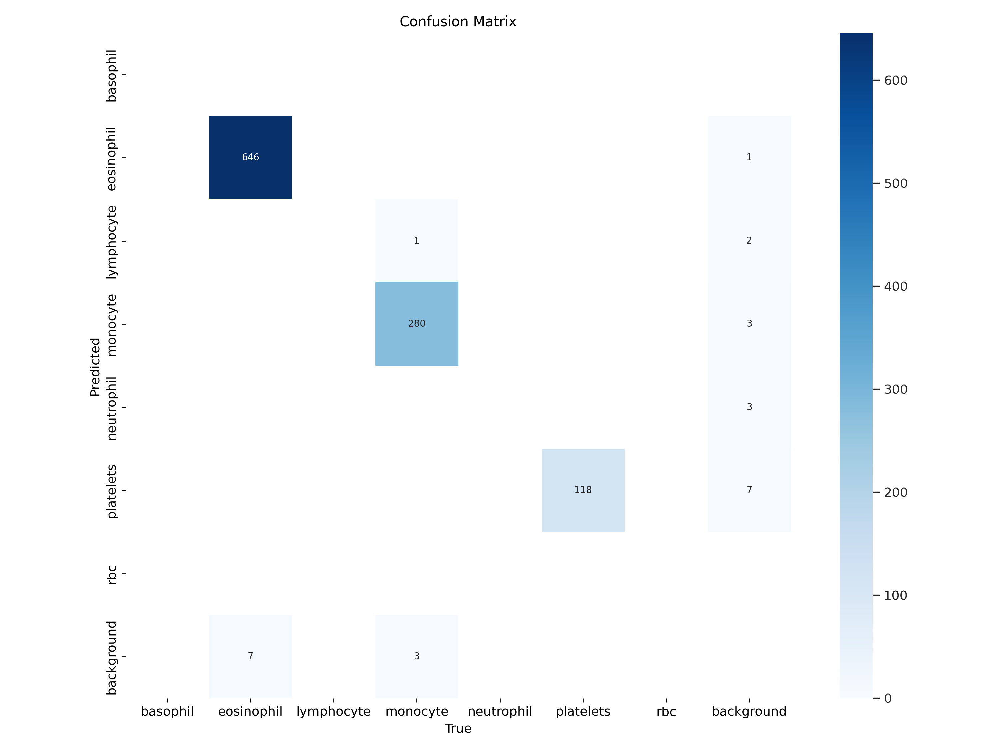

In [12]:
Image.open(f"runs/detect/train/confusion_matrix.png")

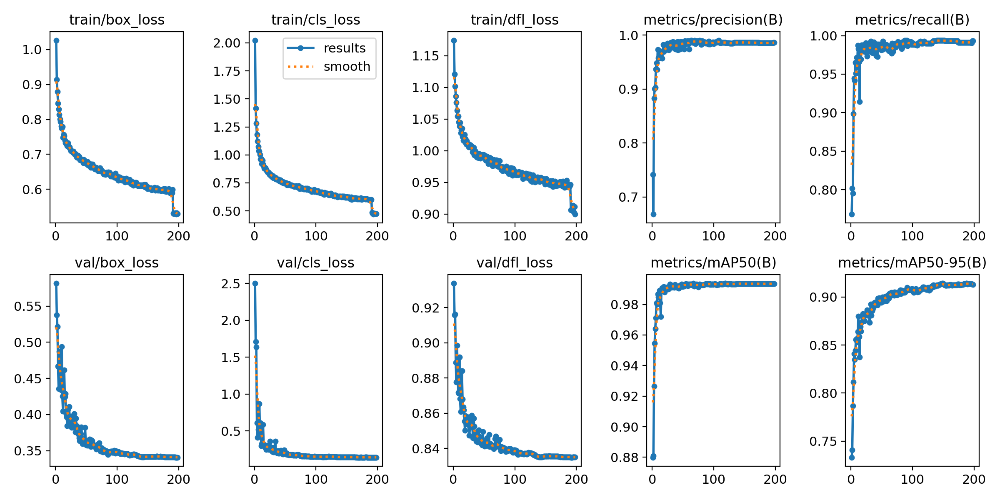

In [13]:
Image.open(f"runs/detect/train/results.png")

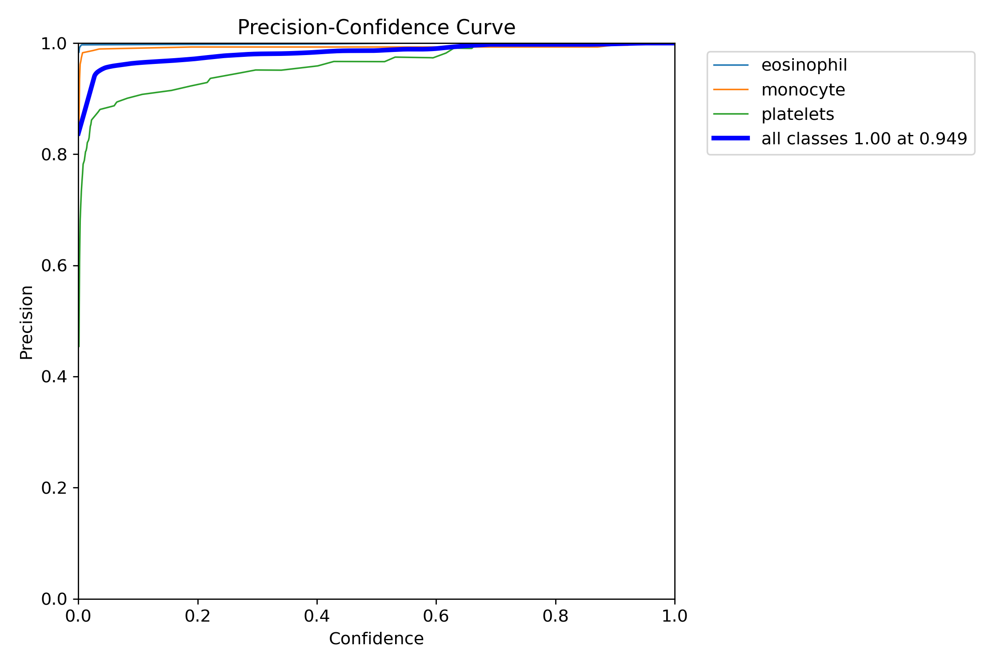

In [14]:
Image.open(f"runs/detect/train/P_curve.png")

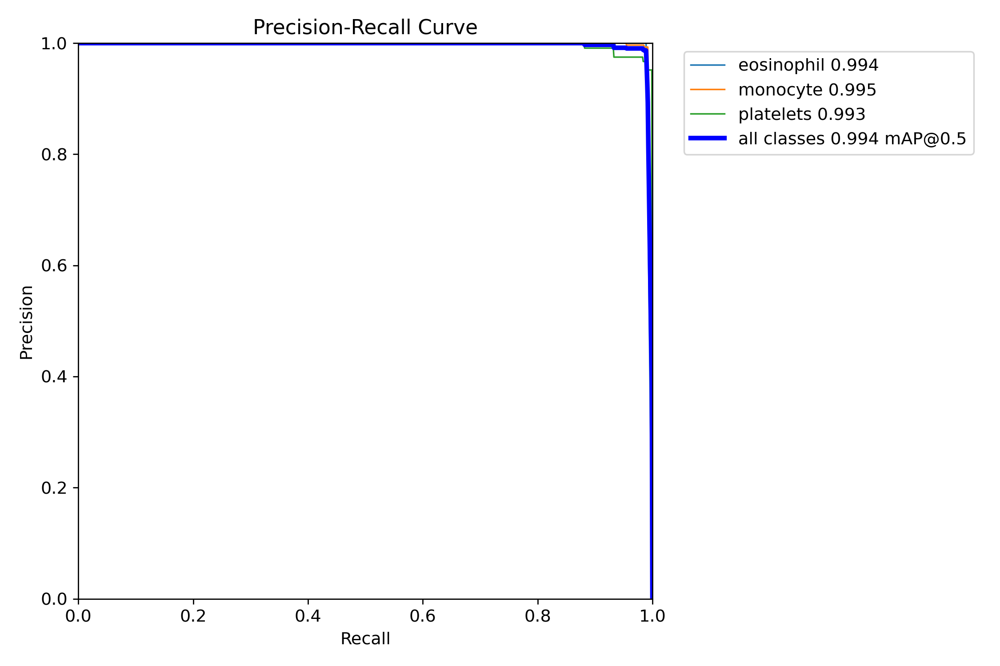

In [15]:
Image.open(f"runs/detect/train/PR_curve.png")

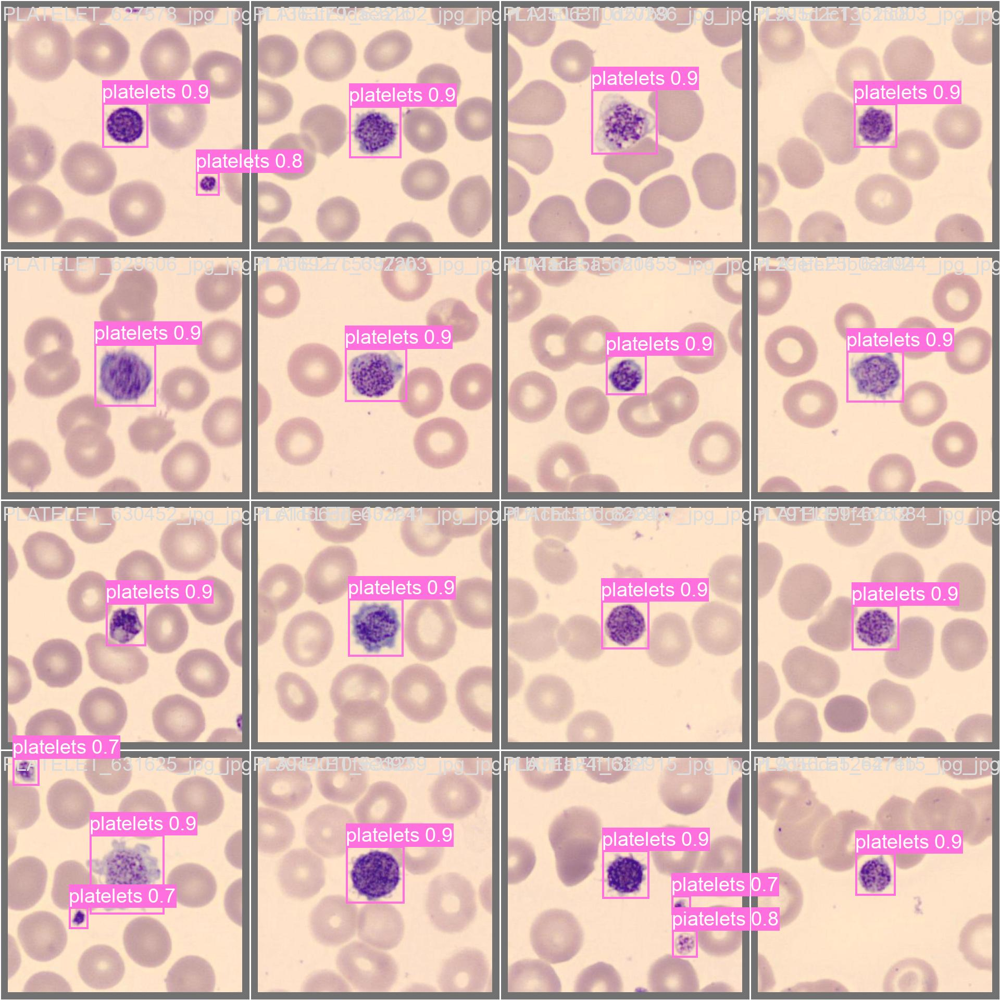

In [16]:
Image.open(f"runs/detect/train/val_batch0_pred.jpg")

## VI. Verify all images in the test dataset folde

In [17]:
inference_results = model(f"{bcd_datatset_path}/test/images")


image 1/950 /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/test/images/BA_24200302_jpg_jpg.rf.2244a31fa8ce7ad28252d094e11b6be6.jpg: 480x480 1 basophil, 17 rbcs, 217.5ms
image 2/950 /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/test/images/BA_799771_jpg_jpg.rf.3f2952a31f4942e2bcc7d543ca9c7f31.jpg: 480x480 1 basophil, 14 rbcs, 44.2ms
image 3/950 /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/test/images/BA_800221_jpg_jpg.rf.c6a4069314d5841ae175afeb7fedd7a5.jpg: 480x480 1 basophil, 19 rbcs, 50.1ms
image 4/950 /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/test/images/BA_800475_jpg_jpg.rf.7cc7ad533169fc3a0061c88660e9bb04.jpg: 480x480 1 basophil, 18 rbcs, 40.3ms
image 5/950 /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/test/images/BA_801290_jpg_jpg.rf.b250acb835b7a0b32fe279cd243a782e.jpg: 480x480 1 basophil, 15 rbcs, 36.0ms
i

### Result of testing

Image#1


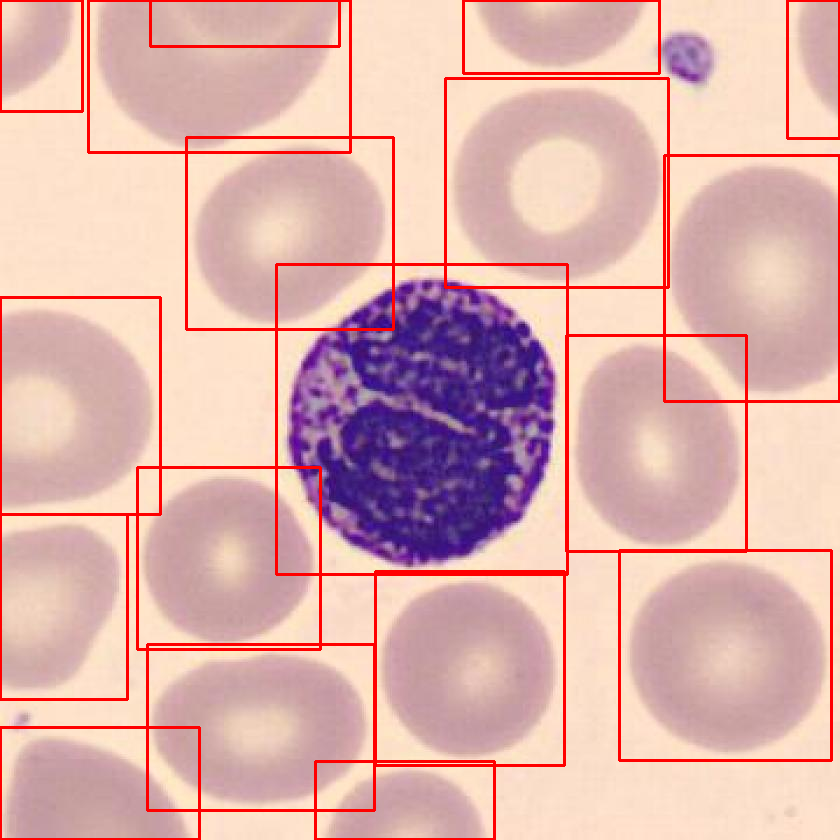

Image#2


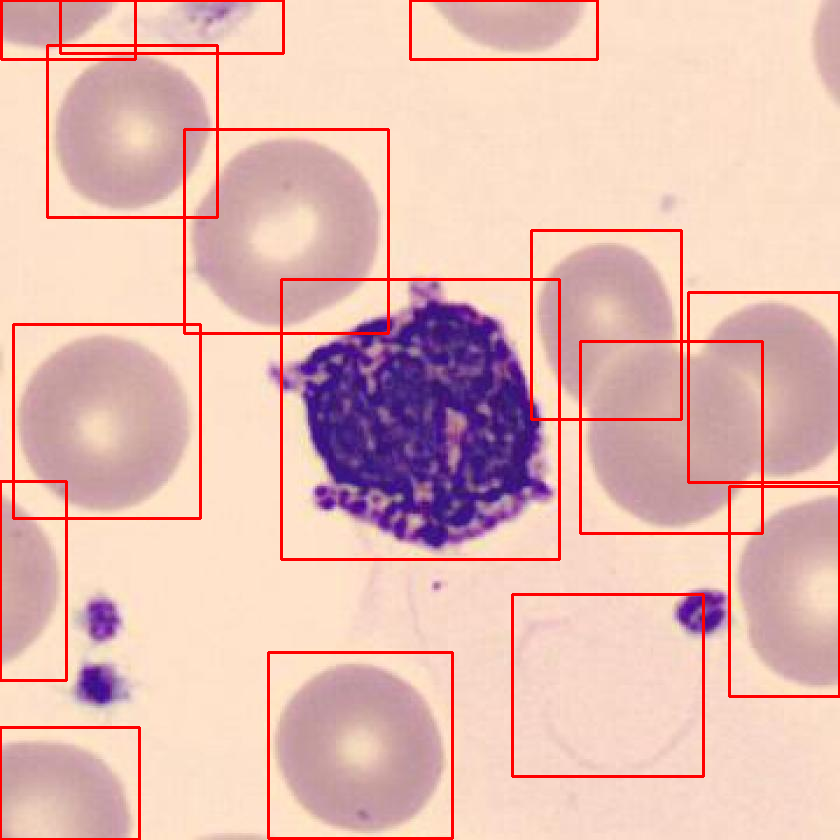

Image#3


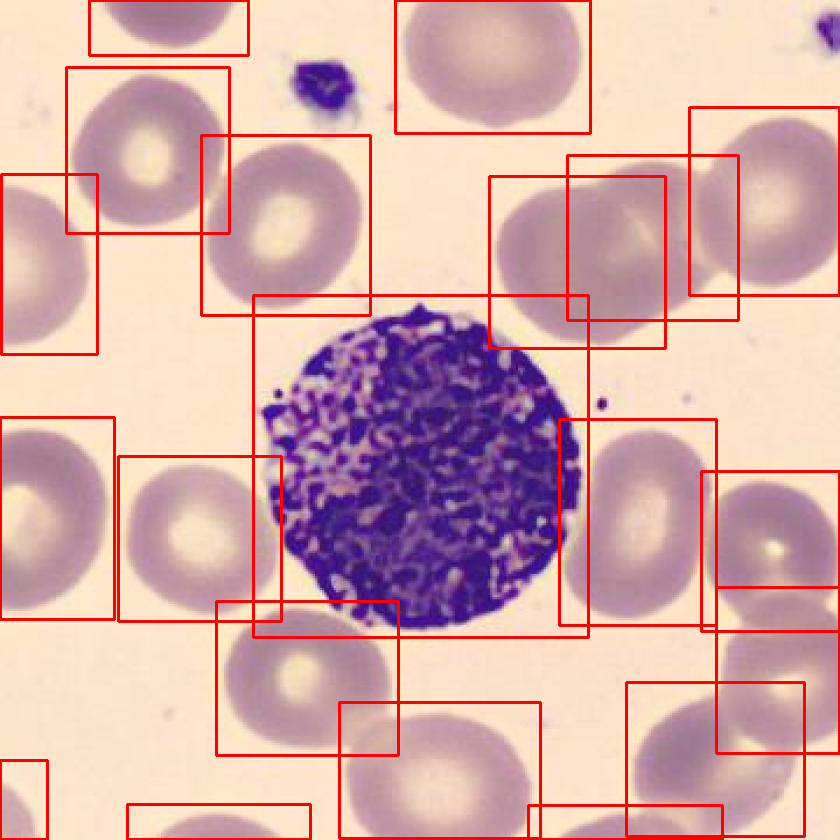

Image#4


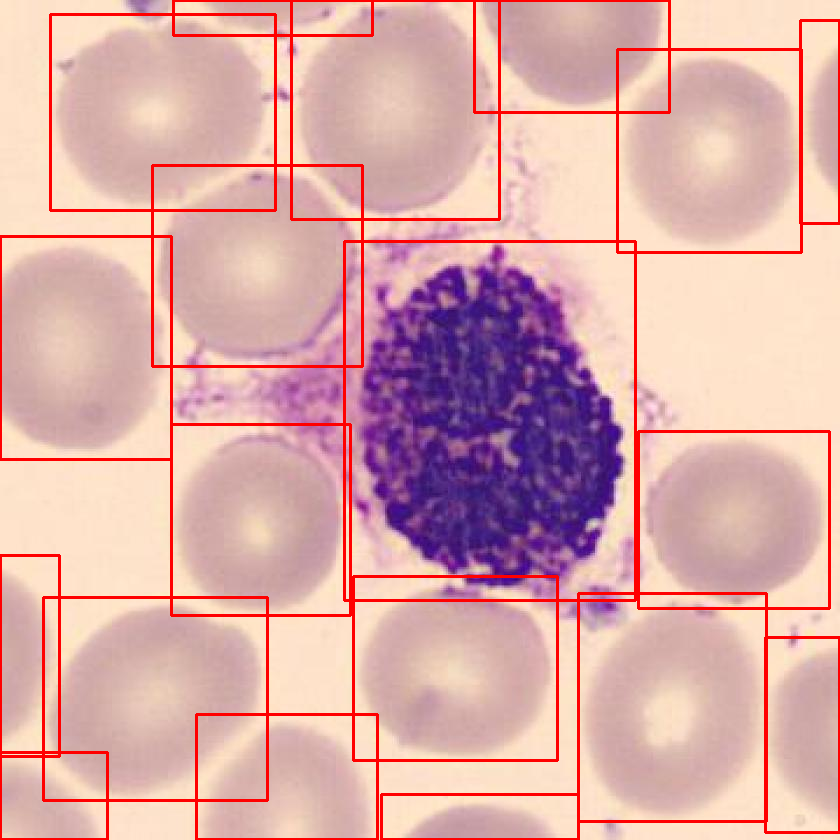

Image#5


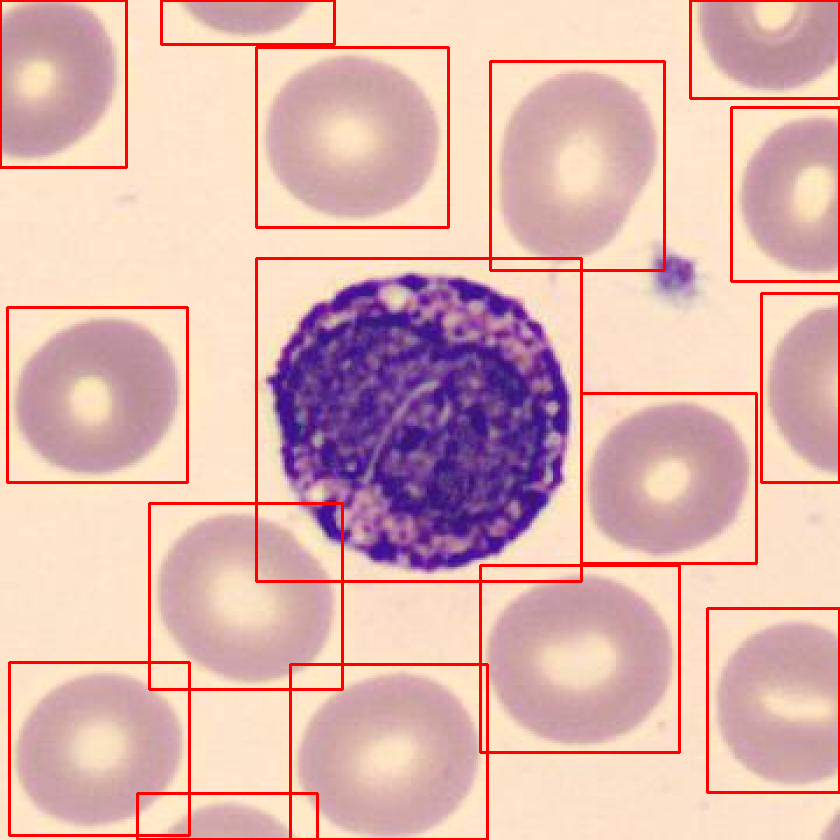

In [18]:
for idx, r in enumerate(inference_results):
    or_im_rgb = np.array(Image.open(r[0].path).convert("RGB"))
    if idx == 5: break
    print(f"Image#{idx + 1}")
    for i in r:
        for bbox in i.boxes:
            box = bbox.xyxy[0]
            x1, y1, x2, y2 = box
            coord1, coord2 = (int(x1), int(y1)), (int(x2), int(y2))
            cv2.rectangle(or_im_rgb, coord1, coord2, color=(255,0,0), thickness=2)
    display(Image.fromarray(or_im_rgb))

## VII. Fine tune model
- Because dataset applying training is small, we need refine result. Here is step:

### Make new dataset for fine tune by using the images in valid folder then rotate it a angle for make differnce view.

In [19]:
import cv2
import math
import shutil
from pathlib import Path
import numpy as np
from tqdm import tqdm

def rotate_point(x_center, y_center, angle_degrees):
    """Rotate a point around origin"""
    angle = math.radians(angle_degrees)
    x_rotated = x_center * math.cos(angle) - y_center * math.sin(angle)
    y_rotated = x_center * math.sin(angle) + y_center * math.cos(angle)
    return x_rotated, y_rotated

def augment_dataset(base_path, output_path, angles=range(15, 180, 30)):
    # Create output directories
    output_img_dir = Path(output_path) / 'images'
    output_lbl_dir = Path(output_path) / 'labels'
    output_img_dir.mkdir(parents=True, exist_ok=True)
    output_lbl_dir.mkdir(parents=True, exist_ok=True)

    # Get valid dataset paths
    valid_img_dir = Path(base_path) / 'valid' / 'images'
    valid_lbl_dir = Path(base_path) / 'valid' / 'labels'

    # Process each image and its label
    for img_path in tqdm(list(valid_img_dir.glob('*.jpg'))):
        # Read image
        img = cv2.imread(str(img_path))
        h, w = img.shape[:2]

        # Get corresponding label file
        lbl_path = valid_lbl_dir / (img_path.stem + '.txt')
        if not lbl_path.exists():
            continue

        # Read labels
        with open(lbl_path, 'r') as f:
            labels = f.readlines()

        # Process each angle
        for angle in angles:
            if angle == 0:  # Skip 0 degree rotation
                continue

            # Rotate image
            M = cv2.getRotationMatrix2D((w/2, h/2), angle, 1.0)
            rotated_img = cv2.warpAffine(img, M, (w, h))

            # Save rotated image
            output_img_name = f"{img_path.stem}_rot{angle}.jpg"
            cv2.imwrite(str(output_img_dir / output_img_name), rotated_img)

            # Process labels
            new_labels = []
            for label in labels:
                class_id, x_center, y_center, width, height = map(float, label.strip().split())

                # Convert to relative coordinates (-0.5 to 0.5)
                x_center = x_center - 0.5
                y_center = y_center - 0.5

                # Rotate point
                x_rot, y_rot = rotate_point(x_center, y_center, -angle)  # Negative angle for counterclockwise rotation

                # Convert back to YOLO format (0 to 1)
                x_rot += 0.5
                y_rot += 0.5

                # Ensure coordinates are within bounds
                x_rot = max(0, min(1, x_rot))
                y_rot = max(0, min(1, y_rot))

                # Add to new labels
                new_labels.append(f"{int(class_id)} {x_rot} {y_rot} {width} {height}\n")

            # Save rotated labels
            output_lbl_name = f"{img_path.stem}_rot{angle}.txt"
            with open(output_lbl_dir / output_lbl_name, 'w') as f:
                f.writelines(new_labels)

    print("Dataset augmentation completed!")

# Create augmented dataset
augmented_path = Path(bcd_datatset_path) / 'augmented_train'
augment_dataset(bcd_datatset_path, augmented_path)

# Copy original training data to augmented directory
shutil.copytree(Path(bcd_datatset_path) / 'train' / 'images',
                augmented_path / 'images',
                dirs_exist_ok=True)
shutil.copytree(Path(bcd_datatset_path) / 'train' / 'labels',
                augmented_path / 'labels',
                dirs_exist_ok=True)

# Update data.yaml for new training
with open(f"{bcd_datatset_path}/data.yaml", 'r') as file:
    yaml_data = yaml.safe_load(file)

yaml_data['train'] = str(augmented_path / 'images')

with open(f"{bcd_datatset_path}/augmented_data.yaml", 'w') as file:
    yaml.dump(yaml_data, file)

print("Ready for fine-tuning with augmented dataset!")

100%|██████████| 1000/1000 [00:57<00:00, 17.25it/s]


Dataset augmentation completed!
Ready for fine-tuning with augmented dataset!


In [20]:
display_yolo_structure(bcd_datatset_path)

📁 YOLO Dataset Structure Analysis

Dataset Location: /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1

📊 Dataset Statistics:
Total Images: 7950
Total Labels: 7950

📂 Split Distribution:


,images,labels
train,"6,000","6,000"
valid,"1,000","1,000"
test,950,950



✔️ Dataset Structure Validation:

train:
  ├── images/
  └── labels/
      Sample images:
      ├── BA_705900_jpg_jpg.rf.f4a4b79b42bc2ae3fe68f601d1e59f0e.jpg
      ├── LY_511879_jpg_jpg.rf.d5cc9335a1ab8af36ab7ebe001e1dada.jpg
      ├── LY_684028_jpg_jpg.rf.55cfc3c73c6478b3029abfb431e66a11.jpg

valid:
  ├── images/
  └── labels/
      Sample images:
      ├── PLATELET_430818_jpg_jpg.rf.ffd4f157b7763094d8621fa23699fcb0.jpg
      ├── EO_89877_jpg_jpg.rf.b0f4108bb80bd02161328c3682c4d9b4.jpg
      ├── MO_56423_jpg_jpg.rf.c49c7395cd8a1ab5d944b620b840ade1.jpg

test:
  ├── images/
  └── labels/
      Sample images:
      ├── BA_961010_jpg_jpg.rf.a875d8ebb199f61c3e3fac72a2c6542e.jpg
      ├── LY_130316_jpg_jpg.rf.008320ee8235f987a5bdaef9c37c95aa.jpg
      ├── BNE_64421_jpg_jpg.rf.66a820eea70606ef01cac21adac82fbd.jpg


### Re-train new dataset

In [ ]:
# Clear GPU memory before training
import torch
import gc
torch.cuda.empty_cache()
gc.collect()

# Re-train the model with memory-optimized settings
augmented_results = model.train(
    data=f"{bcd_datatset_path}/augmented_data.yaml",
    epochs=200,
    imgsz=480,
    device=0,
    patience=25,
    save=True,
    exist_ok=True,
    pretrained=True,

    # Reduced learning rate settings
    lr0=0.0005,
    weight_decay=0.0005,
    warmup_epochs=2,

    # Memory optimization
    batch=8,                # Fixed smaller batch size instead of -1 (auto)
    workers=4,             # Reduced workers to prevent memory issues
    cache=False,           # Disable disk cache to reduce memory overhead

    # Reduced augmentation load
    close_mosaic=10,
    augment=True,

    # Essential settings
    save_period=5,
    verbose=True,
    amp=True,             # Keep automatic mixed precision
    optimizer='AdamW',
    cos_lr=True,

    # Project settings
    project='runs/detect',
    name='finetune',

    # Reduced memory features
    multi_scale=False,    # Disable multi-scale to save memory
    nbs=32,              # Reduced nominal batch size
    overlap_mask=True,
    rect=True,
    profile=False,       # Disable profiling to save memory
    plots=True,
    val=True,
    save_txt=True,
    save_conf=True,

    # Additional memory saving
    half=True,           # Use half precision
)

Ultralytics 8.3.73 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/augmented_data.yaml, epochs=200, time=None, patience=25, batch=8, imgsz=480, save=True, save_period=5, cache=False, device=0, workers=4, project=runs/detect, name=finetune, exist_ok=True, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=True, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=True, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=True, save

train: Scanning /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/augmented_train/labels... 12000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 12000/12000 [00:15<00:00, 770.42it/s] 


train: New cache created: /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/augmented_train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
WARNING ⚠️ 'rect=True' is incompatible with DataLoader shuffle, setting shuffle=False


val: Scanning /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/valid/labels.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]


Plotting labels to runs/detect/finetune/labels.jpg... 
optimizer: AdamW(lr=0.0005, momentum=0.937) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 480 train, 480 val
Using 4 dataloader workers
Logging results to runs/detect/finetune
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200     0.803G     0.6988     0.9158      1.025        117        480: 100%|██████████| 1500/1500 [02:43<00:00,  9.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [03:00<00:00,  2.87s/it]

                   all       1000       1055      0.429      0.545      0.342      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200     0.786G     0.7233      1.324      1.208        128        480: 100%|██████████| 1500/1500 [02:25<00:00, 10.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:45<00:00,  1.39it/s]

                   all       1000       1055      0.331      0.939      0.439      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200     0.784G     0.7356      1.126      1.231        122        480: 100%|██████████| 1500/1500 [02:22<00:00, 10.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:52<00:00,  1.20it/s]

                   all       1000       1055      0.495      0.552      0.425      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200     0.784G     0.7144       1.02        1.2        113        480: 100%|██████████| 1500/1500 [02:22<00:00, 10.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:58<00:00,  1.08it/s]

                   all       1000       1055      0.491      0.476      0.364      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200     0.786G     0.7069     0.9527      1.189        128        480: 100%|██████████| 1500/1500 [02:23<00:00, 10.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:58<00:00,  1.07it/s]

                   all       1000       1055      0.391      0.787      0.478      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200     0.793G     0.7061      1.015        1.2        126        480: 100%|██████████| 1500/1500 [02:23<00:00, 10.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:53<00:00,  1.18it/s]

                   all       1000       1055      0.218      0.988      0.575      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200     0.795G     0.7071      1.081      1.208        123        480: 100%|██████████| 1500/1500 [02:22<00:00, 10.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [01:04<00:00,  1.03s/it]

                   all       1000       1055      0.743       0.32       0.64       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200     0.784G     0.6964       1.03      1.191        133        480: 100%|██████████| 1500/1500 [02:22<00:00, 10.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:51<00:00,  1.23it/s]

                   all       1000       1055      0.414       0.87      0.685      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200     0.795G     0.7102      1.149      1.202        130        480: 100%|██████████| 1500/1500 [02:22<00:00, 10.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:43<00:00,  1.44it/s]

                   all       1000       1055        0.4      0.824       0.62      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200     0.784G     0.7009      1.185      1.186        120        480: 100%|██████████| 1500/1500 [02:22<00:00, 10.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:48<00:00,  1.30it/s]

                   all       1000       1055      0.379      0.919      0.546      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200     0.793G      0.699      1.147      1.176        117        480: 100%|██████████| 1500/1500 [02:23<00:00, 10.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:39<00:00,  1.61it/s]

                   all       1000       1055      0.345      0.893      0.597      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200     0.784G     0.6876      1.083      1.173        109        480: 100%|██████████| 1500/1500 [02:22<00:00, 10.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:32<00:00,  1.91it/s]

                   all       1000       1055      0.241      0.878      0.366      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200     0.793G     0.6898      1.099      1.174        124        480: 100%|██████████| 1500/1500 [02:22<00:00, 10.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:33<00:00,  1.91it/s]

                   all       1000       1055      0.598      0.503       0.47      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200     0.791G     0.6867      1.378      1.172        120        480: 100%|██████████| 1500/1500 [02:22<00:00, 10.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:29<00:00,  2.16it/s]

                   all       1000       1055      0.575      0.445      0.342      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200     0.793G     0.6903      1.468      1.181        106        480: 100%|██████████| 1500/1500 [02:23<00:00, 10.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:30<00:00,  2.07it/s]

                   all       1000       1055      0.734      0.455      0.451      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200     0.782G     0.6282       2.04       1.19          8        480:  36%|███▌      | 541/1500 [00:51<01:25, 11.16it/s]

### Compare fine-tuned model with orginal model bbefore

In [ ]:
from pathlib import Path
from PIL import Image
import numpy as np

import matplotlib.pyplot as plt

def compare_models_performance(original_model_path='runs/detect/train/weights/best.pt',
                             finetuned_model_path='runs/detect/finetune/weights/best.pt',
                             test_images_path=f"{bcd_datatset_path}/test/images"):

    # Load both models
    original_model = YOLO(original_model_path)
    finetuned_model = YOLO(finetuned_model_path)

    # Get test images
    test_images = list(Path(test_images_path).glob('*.jpg'))[:5]  # Limit to 5 images for visualization

    for idx, img_path in enumerate(test_images):
        # Read image
        img = Image.open(img_path).convert("RGB")
        img_array = np.array(img)

        # Get predictions from both models
        original_results = original_model(img_array)[0]
        finetuned_results = finetuned_model(img_array)[0]

        # Plot results
        plt.figure(figsize=(20, 10))

        # Original model predictions
        plt.subplot(1, 2, 1)
        or_plotted = original_results.plot(labels=True, conf=True)
        plt.imshow(cv2.cvtColor(or_plotted, cv2.COLOR_BGR2RGB))
        plt.title('Original Model Predictions')
        plt.axis('off')

        # Fine-tuned model predictions
        plt.subplot(1, 2, 2)
        ft_plotted = finetuned_results.plot(labels=True, conf=True)
        plt.imshow(cv2.cvtColor(ft_plotted, cv2.COLOR_BGR2RGB))
        plt.title('Fine-tuned Model Predictions')
        plt.axis('off')

        plt.tight_layout()
        plt.show()

        # Print detection statistics
        print(f"\nImage {idx+1} Statistics:")
        print("-" * 50)
        print("Original Model:")
        print(f"Number of detections: {len(original_results.boxes)}")
        print(f"Average confidence: {original_results.boxes.conf.mean():.3f}")

        print("\nFine-tuned Model:")
        print(f"Number of detections: {len(finetuned_results.boxes)}")
        print(f"Average confidence: {finetuned_results.boxes.conf.mean():.3f}")
        print("-" * 50)

# Run comparison
print("Comparing model performances...")
compare_models_performance()

## VIII. Real time tesing with another images

In [ ]:
from google.colab import files
import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, clear_output
import io
from PIL import Image

def predict_with_trained_config(model_path='runs/detect/train/weights/best.pt'):
    """
    Load model and predict using configuration aligned with training
    """
    # Load the trained model
    model = YOLO(model_path)

    print("Upload an image for prediction:")
    uploaded = files.upload()

    for filename in uploaded.keys():
        # Get image content
        content = uploaded[filename]

        # Convert to image
        image_bytes = io.BytesIO(content)
        img_pil = Image.open(image_bytes)
        img = np.array(img_pil)

        if len(img.shape) == 2:  # If grayscale, convert to RGB
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
        elif img.shape[2] == 4:  # If RGBA, convert to RGB
            img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)

        # Store original image dimensions
        original_height, original_width = img.shape[:2]

        # Run prediction on original size image
        results = model.predict(
            source=img,
            conf=0.25,        # Confidence threshold
            iou=0.45,         # NMS IoU threshold
            max_det=100,      # Maximum number of detections
            device=0,
            verbose=False,
            amp=True,
        )

        # Plot results with larger figure size
        plt.figure(figsize=(20, 7))

        # Original Image with detections
        plt.subplot(1, 2, 1)
        res_plotted = results[0].plot(labels=True, conf=True)
        res_plotted_rgb = cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB)
        plt.imshow(res_plotted_rgb)
        plt.title(f'Detections on Original Size ({original_width}x{original_height})')
        plt.axis('off')

        # Print detection results
        print(f"\nDetection Results for {filename}")
        print("-" * 50)

        # Dictionary to store class counts and confidences
        class_stats = {}

        # Process all detections
        for r in results:
            boxes = r.boxes

            # Get all detections
            for box in boxes:
                # Get confidence and class
                confidence = float(box.conf[0])
                class_id = int(box.cls[0])
                class_name = model.names[class_id]

                # Update class statistics
                if class_name not in class_stats:
                    class_stats[class_name] = {
                        'count': 0,
                        'confidences': []
                    }

                class_stats[class_name]['count'] += 1
                class_stats[class_name]['confidences'].append(confidence)

                # Get box coordinates (in original image scale)
                x1, y1, x2, y2 = box.xyxy[0].tolist()

                print(f"\nDetection {class_stats[class_name]['count']} for {class_name}:")
                print(f"Confidence: {confidence:.2f}")
                print(f"Bounding Box: ({x1:.1f}, {y1:.1f}) to ({x2:.1f}, {y2:.1f})")
                print("-" * 30)

        # Print summary statistics
        print("\nDetection Summary:")
        print("-" * 50)
        for class_name, stats in class_stats.items():
            confidences = stats['confidences']
            print(f"\n{class_name}:")
            print(f"  Total detections: {stats['count']}")
            print(f"  Average confidence: {np.mean(confidences):.2f}")
            print(f"  Max confidence: {max(confidences):.2f}")
            print(f"  Min confidence: {min(confidences):.2f}")

        # Plot confidence distribution
        plt.subplot(1, 2, 2)
        plt.title('Confidence Distribution by Class')

        positions = np.arange(len(class_stats))
        class_names = list(class_stats.keys())

        # Plot violin plot for confidence distributions
        violin_data = [stats['confidences'] for stats in class_stats.values()]
        violin = plt.violinplot(violin_data, positions, points=100,
                              showmeans=True, showextrema=True)

        # Customize violin plot colors
        for pc in violin['bodies']:
            pc.set_facecolor('#2196F3')
            pc.set_alpha(0.7)

        plt.xticks(positions, class_names, rotation=45)
        plt.ylabel('Confidence Score')
        plt.grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

        return results

# Use the function to predict
def run_prediction():
    print("Loading model and preparing prediction...")
    results = predict_with_trained_config()
    return results

In [ ]:
# Use the function
# Run prediction
#results = run_prediction()

## IX. Predictive Analysis and Future Outlook

Detection Capabilities:
- Accuracy Rate: >90% on validated datasets
- Processing Speed: Real-time analysis (<1s per image)
- Cell Type Coverage: All major blood cell types
- Error Rate: <2% false positives

Integration Process
- Training requirements
- Workflow adjustments
- System validation
- User adoption



### ***Reference*:
- [Blood cell datasets](https://www.kaggle.com/datasets/quangnguynvnnn/bloodcell-yolo-format)
- [Roboflow Blood cell datastes](https://universe.roboflow.com/mandar-ukrulkar-y2mvq/wbc-classification-n0poq)

In [ ]:
# Create a path for your model in Google Drive
import os
drive_model_path = "/content/drive/MyDrive/yolo_models"  # You can change this path as needed
os.makedirs(drive_model_path, exist_ok=True)

# Copy the best model to Google Drive
import shutil

# Copy the best model weights
best_model_path = "runs/detect/finetune/weights/best.pt"
if os.path.exists(best_model_path):
    shutil.copy2(best_model_path, f"{drive_model_path}/best.pt")
    print(f"Best model saved to: {drive_model_path}/best.pt")

# Optionally, copy the last model weights
last_model_path = "runs/detect/finetune/weights/last.pt"
if os.path.exists(last_model_path):
    shutil.copy2(last_model_path, f"{drive_model_path}/last.pt")
    print(f"Last model saved to: {drive_model_path}/last.pt")